In [179]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
from datetime import datetime
import ast
import time
import matplotlib.pyplot as plt
plt.style.use('ggplot')

# **Data Collection & Scraping**

In [180]:
headers = {"User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/70.0.3538.77 Safari/537.36"}

In [181]:
response = requests.get("https://www.news247.gr/ypoklopes")
ypo = BeautifulSoup(response.text, 'html.parser')

In [182]:
headlines = ypo.find_all('h2')
for headline in headlines:
    print(headline.text)


                ΜΕ ΜΙΑ ΜΑΤΙΑ


                            ΑΠΘ: Στο Αυτόφωρο οι τρεις συλληφθέντες των χθεσινών επεισοδίων



                            ΗΠΑ: Αποφάσισαν την πλήρη άρση του εμπάργκο πώλησης όπλων στην Κύπρο



                            Ασπρόπυργος: Ξέχασαν 9χρονο σε σχολικό - Δύο συλλήψεις





ΣΥΡΙΖΑ για υποκλοπές: "Όλη η αντιπολίτευση ζητεί άμεση σύγκληση της Επιτροπής Θεσμών"


Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμετώπιση της ακρίβειας


Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβέρνησης για τις υποκλοπές


Ο "πατέρας" του Predator κάνει στην Αθήνα ένα παλιό κόλπο


Με 6 "Εθνικές Προτεραιότητες" ο Τσίπρας στην ΔΕΘ


Γιώργος Σωτηρέλης: Οι ανεξάρτητες Αρχές είναι η μόνη αξιόπιστη εγγύηση γα την προστασία της ιδιωτικής ζωής


Παύλος Γερουλάνος: Η Δημοκρατία εκδικείται την ύβρη


Τσίπρας και ΔΕΘ, τι περιμένουμε ν’ ακούσουμε


Νίκος Παρασκευόπουλος: Κοινοβουλευτική Επιτροπή Διαφάνειας ή Σκότους;


ΣΥΡΙΖΑ για σκάνδαλο υποκλοπών: Μεγαλώνει το "κάδρο" αλλά και

In [183]:
links = ypo.select("h2 a")

In [184]:
urls = [link['href'] for link in links]
urls

['https://www.news247.gr/koinonia/apth-sto-aytoforo-oi-treis-syllifthentes-ton-chthesinon-epeisodion.9761974.html',
 'https://www.news247.gr/kosmos/ipa-apofasisan-tin-pliri-arsi-toy-empargko-polisis-oplon-stin-kypro.9761648.html',
 'https://www.news247.gr/koinonia/aspropyrgos-xechasan-6chrono-se-scholiko-dyo-syllipseis.9761734.html',
 'https://www.news247.gr/politiki/syriza-gia-ypoklopes-oli-i-antipoliteysi-zitei-amesi-sygklisi-tis-epitropis-thesmon.9761993.html',
 'https://www.news247.gr/politiki/nasos-iliopoylos-proteraiotita-tsipra-i-antimetopisi-tis-akriveias.9761807.html',
 'https://www.news247.gr/politiki/o-adonis-georgiadis-allazei-to-afigima-tis-kyvernisis-gia-tis-ypoklopes.9761783.html',
 'https://www.news247.gr/sunday-edition/o-pateras-toy-predator-kanei-stin-athina-ena-palio-kolpo.9761090.html',
 'https://www.news247.gr/politiki/me-6-ethnikes-proteraiotites-o-tsipras-stin-deth.9761404.html',
 'https://www.news247.gr/politiki/giorgos-sotirelis-oi-anexartites-arches-einai-i-mo

In [185]:
titles = [link.text for link in links]
titles

['\n                            ΑΠΘ: Στο Αυτόφωρο οι τρεις συλληφθέντες των χθεσινών επεισοδίων',
 '\n                            ΗΠΑ: Αποφάσισαν την πλήρη άρση του εμπάργκο πώλησης όπλων στην Κύπρο',
 '\n                            Ασπρόπυργος: Ξέχασαν 9χρονο σε σχολικό - Δύο συλλήψεις',
 'ΣΥΡΙΖΑ για υποκλοπές: "Όλη η αντιπολίτευση ζητεί άμεση σύγκληση της Επιτροπής Θεσμών"',
 'Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμετώπιση της ακρίβειας',
 'Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβέρνησης για τις υποκλοπές',
 'Ο "πατέρας" του Predator κάνει στην Αθήνα ένα παλιό κόλπο',
 'Με 6 "Εθνικές Προτεραιότητες" ο Τσίπρας στην ΔΕΘ',
 'Γιώργος Σωτηρέλης: Οι ανεξάρτητες Αρχές είναι η μόνη αξιόπιστη εγγύηση γα την προστασία της ιδιωτικής ζωής',
 'Παύλος Γερουλάνος: Η Δημοκρατία εκδικείται την ύβρη',
 'Τσίπρας και ΔΕΘ, τι περιμένουμε ν’ ακούσουμε',
 'Νίκος Παρασκευόπουλος: Κοινοβουλευτική Επιτροπή Διαφάνειας ή Σκότους;',
 'ΣΥΡΙΖΑ για σκάνδαλο υποκλοπών: Μεγαλώνει το "κάδρο" αλλά και οι π

In [186]:
scraped_links = []
titles = []
counter = 0
base_url = "https://www.news247.gr/ypoklopes?pages="
for i in range(1,9):
    url = base_url + str(i)
    page = requests.get(url, headers = headers)
    s = BeautifulSoup(page.content, 'html.parser')
    links = s.select("h2 a")
    links = set(links)
    
    url = [link['href'] for link in links]    

    print(url)

    for l in url:
        link = l
        print(l)
        scraped_links.append(l)


print(len(scraped_links)) 

ypo_links = (set(scraped_links))

['https://www.news247.gr/politiki/exetastiki-gia-ypoklopes-tora-kai-trampoykismoi-kyranaki-ektos-apo-sygkalypsi.9760026.html', 'https://www.news247.gr/politiki/ypoklopes-to-pasok-zita-sygklisi-tis-epitropis-thesmon-logo-prostheton-stoicheion.9760102.html', 'https://www.news247.gr/politiki/syriza-gia-ypoklopes-dilonei-enochos-mitsotakis-me-koykoyloma-poy-epicheirei.9758993.html', 'https://www.news247.gr/politiki/androylakis-sti-deth-epiteliko-parakratos-mitsotaki-poy-elegchei-tin-exoysia.9758742.html', 'https://www.news247.gr/politiki/fake-news-gia-roympati-ti-pragmatika-eipe-stin-exetastiki.9758653.html', 'https://www.news247.gr/politiki/syriza-gia-skandalo-ypoklopon-megalonei-kadro-oi-prospatheies-sygkalypsis.9760125.html', 'https://www.news247.gr/politiki/ypoklopes-aitima-kke-gia-sygklisi-tis-epitropis-thesmon-kai-diafaneias-gia-tin-katastrofi-ton-archeion-stin-eyp.9759525.html', 'https://www.news247.gr/politiki/o-adonis-georgiadis-allazei-to-afigima-tis-kyvernisis-gia-tis-ypoklopes.

In [187]:
len(ypo_links)

321

# **DataFrame**

In [188]:
ypo = pd.DataFrame(ypo_links, columns= ['url'])
ypo

,url
0,https://www.news247.gr/politiki/paremvasi-taso...
1,https://www.news247.gr/kosmos/financial-times-...
2,https://www.news247.gr/sunday-edition/nikos-al...
3,https://www.news247.gr/politiki/liakoyli-gia-e...
4,https://www.news247.gr/gnomes/gerasimos-livits...
...,...
316,https://www.news247.gr/politiki/koytsoympas-an...
317,https://www.news247.gr/politiki/pasok-omerta-e...
318,https://www.news247.gr/politiki/ypoklopes-pos-...
319,https://www.news247.gr/politiki/pasok-nea-epit...


In [189]:
ypo.to_csv("ypo.csv", index=False)
ypo = pd.read_csv('ypo.csv')
ypo

,url
0,https://www.news247.gr/politiki/paremvasi-taso...
1,https://www.news247.gr/kosmos/financial-times-...
2,https://www.news247.gr/sunday-edition/nikos-al...
3,https://www.news247.gr/politiki/liakoyli-gia-e...
4,https://www.news247.gr/gnomes/gerasimos-livits...
...,...
316,https://www.news247.gr/politiki/koytsoympas-an...
317,https://www.news247.gr/politiki/pasok-omerta-e...
318,https://www.news247.gr/politiki/ypoklopes-pos-...
319,https://www.news247.gr/politiki/pasok-nea-epit...


In [190]:
urls = ypo['url'].tolist()
urls[0:100]

['https://www.news247.gr/politiki/paremvasi-tasoyla-yper-tis-logikis-toy-aporritoy-kai-stin-exetastiki-gia-tis-ypoklopes.9748031.html',
 'https://www.news247.gr/kosmos/financial-times-arthro-kyriakos-mitsotakis-ypoklopes-oikonomia-toyrkia-stochastro-ft.9753451.html',
 'https://www.news247.gr/sunday-edition/nikos-alivizatos-oi-kyverniseis-paraitoyntai-otan-yparchoyn-skandala-me-prothypoyrgikes-eythynes.9729711.html',
 'https://www.news247.gr/politiki/liakoyli-gia-exetastiki-i-kyvernisi-thelei-na-kratisei-tin-alitheia-sto-skotadi.9749416.html',
 'https://www.news247.gr/gnomes/gerasimos-livitsanos/o-ypogeios-polemos-poy-tha-eprepe-na-mainetai-stin-n-d.9756293.html',
 'https://www.news247.gr/politiki/kontiadis-antitheti-syntagma-arnisi-synergasias-emplekomeon-epitropi-voylis.9742873.html',
 'https://www.news247.gr/politiki/to-pasok-kalei-mitsotaki-na-arei-to-aporrito-gia-tin-parakoloythisi-androylaki.9742937.html',
 'https://www.news247.gr/politiki/o-peirasmos-toy-eklogikoy-nomoy-kai-to-pl

In [191]:
len(urls)

321

In [192]:
response = requests.get("https://www.news247.gr/ypoklopes", headers=headers)

doc = BeautifulSoup(response.text)

In [193]:
from urllib.request import urlopen, Request
from bs4 import BeautifulSoup
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
import numpy as np

In [194]:
ypo = pd.DataFrame(columns = ['Title', 'created_at', 'URL', 'text', 'About_text', 'About_URL'])

In [195]:
titles = []
links = []
authors = [] 
dates = []
descs = []
abouts_text = []
abouts_URL = []


for i in range(1,9):
  my_url = 'https://www.news247.gr/ypoklopes?pages='+str(i)
  req = Request(my_url,headers={'User-Agent': 'Mozilla/5.0'})
  raw_html = urlopen(req).read()
  news = BeautifulSoup(raw_html, "html.parser")


  titles_soup = news.find_all("h2", {"class": "article__title bold"})

  for title in titles_soup:
    links.append(title.find('a')['href'])
    titles.append((title.text).replace('\n',''))
  
  abouts_soup = news.find_all("div", {"class": "article__summary"})
  for about in abouts_soup:
    info = (about.text).splitlines()
    # print(info)
    abouts_text.append(info[1])

    descs.append(info[2])
    date = about.find('span', {"class": "article__time"}).find('time').get('datetime')

    dates.append(date)

    abouts_URL.append(about.find('a')['href'])

print(len(titles))
print(len(links))
print(len(dates))
print(len(descs))
print(len(abouts_text))
print(len(abouts_URL))

320
320
320
320
320
320


In [196]:
ypo = pd.DataFrame(columns = ['Title', 'created_at', 'URL', 'text', 'About_text', 'About_URL'])

for i in range(0, len(titles)):
  ypo = ypo.append({'Title' : titles[i], 'created_at' : dates[i], 'URL' : links[i], 'text' : descs[i], 'About_text' : abouts_text[i], 'About_URL' : abouts_URL[i]}, ignore_index=True)


In [197]:
ypo

,Title,created_at,URL,text,About_text,About_URL
0,"ΣΥΡΙΖΑ για υποκλοπές: ""Όλη η αντιπολίτευση ζητ...",2022-09-17 15:05,https://www.news247.gr/politiki/syriza-gia-ypo...,"Κοινό ""μέτωπο"" της αντιπολίτευσης για άμεση σύ...",ΕΥΠ,https://www.news247.gr/eyp
1,Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμ...,2022-09-17 12:30,https://www.news247.gr/politiki/nasos-iliopoyl...,Ο εκπρόσωπος Τύπου του ΣΥΡΙΖΑ τόνισε πως ο Αλέ...,ΣΥ.ΡΙΖ.Α.,https://www.news247.gr/syriza
2,Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβ...,2022-09-17 10:55,https://www.news247.gr/politiki/o-adonis-georg...,"""Αλλαγή πλεύσης"" στο αφήγημα της κυβέρνησης γι...",ΥΠΟΚΛΟΠΕΣ,https://www.news247.gr/ypoklopes
3,"Ο ""πατέρας"" του Predator κάνει στην Αθήνα ένα ...",2022-09-17 09:08,https://www.news247.gr/sunday-edition/o-patera...,Το Magazine παρουσιάζει εσωτερικά email και τι...,ΥΠΟΚΛΟΠΕΣ,https://www.news247.gr/ypoklopes
4,"Με 6 ""Εθνικές Προτεραιότητες"" ο Τσίπρας στην ΔΕΘ",2022-09-17 07:38,https://www.news247.gr/politiki/me-6-ethnikes-...,,ΔΕΘ 2022,https://www.news247.gr/deth-2022
...,...,...,...,...,...,...
315,"""Κεφαλοκλείδωμα"" στο Μαξίμου για τις υποκλοπές",2022-08-19 06:24,https://www.news247.gr/politiki/kefalokleidoma...,Η Όλγα Κεφαλογιάννη έριξε μία τροχιοδεικτική β...,ΟΛΓΑ ΚΕΦΑΛΟΓΙΑΝΝΗ,https://www.news247.gr/olga-kefalogianni
316,Η Εξεταστική για τις υποκλοπές να ξεκινήσει απ...,2022-08-19 06:09,https://www.news247.gr/gnomes/gerasimos-livits...,Αντί για άμεση διαλεύκανση του σκανδάλου η κυβ...,ΒΟΥΛΗ,https://www.news247.gr/vouli
317,"Οι ""κοριοί"" στον Ανδρουλάκη φέρνουν την πολιτι...",2022-08-19 06:09,https://www.news247.gr/gnomes/giwrgos-karelias...,Από την μη κανονικότητα στην πολιτική ζωή της ...,ΥΠΟΚΛΟΠΕΣ,https://www.news247.gr/ypoklopes
318,Σκάνδαλο υποκλοπών: Εκτενές αφιέρωμα και από τ...,2022-08-18 19:44,https://www.news247.gr/politiki/skandalo-ypokl...,Ένα ακόμα μεγάλο διεθνές ΜΜΕ καταπιάστηκε με τ...,ΥΠΟΚΛΟΠΕΣ,https://www.news247.gr/ypoklopes


In [198]:
ypo.dtypes

Title         object
created_at    object
URL           object
text          object
About_text    object
About_URL     object
dtype: object

In [199]:
ypo_doc = ypo[['Title','created_at', 'URL', 'text', 'About_text',  ]]
ypo_doc

,Title,created_at,URL,text,About_text
0,"ΣΥΡΙΖΑ για υποκλοπές: ""Όλη η αντιπολίτευση ζητ...",2022-09-17 15:05,https://www.news247.gr/politiki/syriza-gia-ypo...,"Κοινό ""μέτωπο"" της αντιπολίτευσης για άμεση σύ...",ΕΥΠ
1,Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμ...,2022-09-17 12:30,https://www.news247.gr/politiki/nasos-iliopoyl...,Ο εκπρόσωπος Τύπου του ΣΥΡΙΖΑ τόνισε πως ο Αλέ...,ΣΥ.ΡΙΖ.Α.
2,Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβ...,2022-09-17 10:55,https://www.news247.gr/politiki/o-adonis-georg...,"""Αλλαγή πλεύσης"" στο αφήγημα της κυβέρνησης γι...",ΥΠΟΚΛΟΠΕΣ
3,"Ο ""πατέρας"" του Predator κάνει στην Αθήνα ένα ...",2022-09-17 09:08,https://www.news247.gr/sunday-edition/o-patera...,Το Magazine παρουσιάζει εσωτερικά email και τι...,ΥΠΟΚΛΟΠΕΣ
4,"Με 6 ""Εθνικές Προτεραιότητες"" ο Τσίπρας στην ΔΕΘ",2022-09-17 07:38,https://www.news247.gr/politiki/me-6-ethnikes-...,,ΔΕΘ 2022
...,...,...,...,...,...
315,"""Κεφαλοκλείδωμα"" στο Μαξίμου για τις υποκλοπές",2022-08-19 06:24,https://www.news247.gr/politiki/kefalokleidoma...,Η Όλγα Κεφαλογιάννη έριξε μία τροχιοδεικτική β...,ΟΛΓΑ ΚΕΦΑΛΟΓΙΑΝΝΗ
316,Η Εξεταστική για τις υποκλοπές να ξεκινήσει απ...,2022-08-19 06:09,https://www.news247.gr/gnomes/gerasimos-livits...,Αντί για άμεση διαλεύκανση του σκανδάλου η κυβ...,ΒΟΥΛΗ
317,"Οι ""κοριοί"" στον Ανδρουλάκη φέρνουν την πολιτι...",2022-08-19 06:09,https://www.news247.gr/gnomes/giwrgos-karelias...,Από την μη κανονικότητα στην πολιτική ζωή της ...,ΥΠΟΚΛΟΠΕΣ
318,Σκάνδαλο υποκλοπών: Εκτενές αφιέρωμα και από τ...,2022-08-18 19:44,https://www.news247.gr/politiki/skandalo-ypokl...,Ένα ακόμα μεγάλο διεθνές ΜΜΕ καταπιάστηκε με τ...,ΥΠΟΚΛΟΠΕΣ


In [200]:
ypo_doc.dtypes

Title         object
created_at    object
URL           object
text          object
About_text    object
dtype: object

In [201]:

ypo_doc['Year'] = ypo_doc.created_at.apply(lambda dt: dt.replace(' ', '-').split('-')[0])
ypo_doc['Month'] = ypo_doc.created_at.apply(lambda dt: dt.replace(' ', '-').split('-')[1])
ypo_doc['Day'] = ypo_doc.created_at.apply(lambda dt: dt.replace(' ', '-').split('-')[2])
ypo_doc['Time'] = ypo_doc.created_at.apply(lambda dt: dt.replace(' ', '-').split('-')[3])


ypo_doc.loc[[291]]

,Title,created_at,URL,text,About_text,Year,Month,Day,Time
291,"Υποκλοπές: Το κοινό ""μέτωπο"" ΣΥΡΙΖΑ- ΠΑΣΟΚ ανη...",2022-08-23 06:04,https://www.news247.gr/politiki/ypoklopes-to-k...,Η σύμπλευση ΣΥΡΙΖΑ- ΠΑΣΟΚ στο θέμα της εξεταστ...,ΒΟΥΛΗ,2022,08,23,06:04


In [202]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [203]:
ypo_doc.to_csv("/content/gdrive/My Drive/Colab Notebooks/ypoklopes.tsv", sep='\t')

# **Analysis**

In [204]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
from datetime import datetime
import ast
import time
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer
plt.style.use('ggplot')

In [205]:
ypo_doc

,Title,created_at,URL,text,About_text,Year,Month,Day,Time
0,"ΣΥΡΙΖΑ για υποκλοπές: ""Όλη η αντιπολίτευση ζητ...",2022-09-17 15:05,https://www.news247.gr/politiki/syriza-gia-ypo...,"Κοινό ""μέτωπο"" της αντιπολίτευσης για άμεση σύ...",ΕΥΠ,2022,09,17,15:05
1,Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμ...,2022-09-17 12:30,https://www.news247.gr/politiki/nasos-iliopoyl...,Ο εκπρόσωπος Τύπου του ΣΥΡΙΖΑ τόνισε πως ο Αλέ...,ΣΥ.ΡΙΖ.Α.,2022,09,17,12:30
2,Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβ...,2022-09-17 10:55,https://www.news247.gr/politiki/o-adonis-georg...,"""Αλλαγή πλεύσης"" στο αφήγημα της κυβέρνησης γι...",ΥΠΟΚΛΟΠΕΣ,2022,09,17,10:55
3,"Ο ""πατέρας"" του Predator κάνει στην Αθήνα ένα ...",2022-09-17 09:08,https://www.news247.gr/sunday-edition/o-patera...,Το Magazine παρουσιάζει εσωτερικά email και τι...,ΥΠΟΚΛΟΠΕΣ,2022,09,17,09:08
4,"Με 6 ""Εθνικές Προτεραιότητες"" ο Τσίπρας στην ΔΕΘ",2022-09-17 07:38,https://www.news247.gr/politiki/me-6-ethnikes-...,,ΔΕΘ 2022,2022,09,17,07:38
...,...,...,...,...,...,...,...,...,...
315,"""Κεφαλοκλείδωμα"" στο Μαξίμου για τις υποκλοπές",2022-08-19 06:24,https://www.news247.gr/politiki/kefalokleidoma...,Η Όλγα Κεφαλογιάννη έριξε μία τροχιοδεικτική β...,ΟΛΓΑ ΚΕΦΑΛΟΓΙΑΝΝΗ,2022,08,19,06:24
316,Η Εξεταστική για τις υποκλοπές να ξεκινήσει απ...,2022-08-19 06:09,https://www.news247.gr/gnomes/gerasimos-livits...,Αντί για άμεση διαλεύκανση του σκανδάλου η κυβ...,ΒΟΥΛΗ,2022,08,19,06:09
317,"Οι ""κοριοί"" στον Ανδρουλάκη φέρνουν την πολιτι...",2022-08-19 06:09,https://www.news247.gr/gnomes/giwrgos-karelias...,Από την μη κανονικότητα στην πολιτική ζωή της ...,ΥΠΟΚΛΟΠΕΣ,2022,08,19,06:09
318,Σκάνδαλο υποκλοπών: Εκτενές αφιέρωμα και από τ...,2022-08-18 19:44,https://www.news247.gr/politiki/skandalo-ypokl...,Ένα ακόμα μεγάλο διεθνές ΜΜΕ καταπιάστηκε με τ...,ΥΠΟΚΛΟΠΕΣ,2022,08,18,19:44


In [206]:
ypo_doc = ypo_doc.rename(columns= {'About_text': 'Keywords'})
ypo_doc

,Title,created_at,URL,text,Keywords,Year,Month,Day,Time
0,"ΣΥΡΙΖΑ για υποκλοπές: ""Όλη η αντιπολίτευση ζητ...",2022-09-17 15:05,https://www.news247.gr/politiki/syriza-gia-ypo...,"Κοινό ""μέτωπο"" της αντιπολίτευσης για άμεση σύ...",ΕΥΠ,2022,09,17,15:05
1,Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμ...,2022-09-17 12:30,https://www.news247.gr/politiki/nasos-iliopoyl...,Ο εκπρόσωπος Τύπου του ΣΥΡΙΖΑ τόνισε πως ο Αλέ...,ΣΥ.ΡΙΖ.Α.,2022,09,17,12:30
2,Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβ...,2022-09-17 10:55,https://www.news247.gr/politiki/o-adonis-georg...,"""Αλλαγή πλεύσης"" στο αφήγημα της κυβέρνησης γι...",ΥΠΟΚΛΟΠΕΣ,2022,09,17,10:55
3,"Ο ""πατέρας"" του Predator κάνει στην Αθήνα ένα ...",2022-09-17 09:08,https://www.news247.gr/sunday-edition/o-patera...,Το Magazine παρουσιάζει εσωτερικά email και τι...,ΥΠΟΚΛΟΠΕΣ,2022,09,17,09:08
4,"Με 6 ""Εθνικές Προτεραιότητες"" ο Τσίπρας στην ΔΕΘ",2022-09-17 07:38,https://www.news247.gr/politiki/me-6-ethnikes-...,,ΔΕΘ 2022,2022,09,17,07:38
...,...,...,...,...,...,...,...,...,...
315,"""Κεφαλοκλείδωμα"" στο Μαξίμου για τις υποκλοπές",2022-08-19 06:24,https://www.news247.gr/politiki/kefalokleidoma...,Η Όλγα Κεφαλογιάννη έριξε μία τροχιοδεικτική β...,ΟΛΓΑ ΚΕΦΑΛΟΓΙΑΝΝΗ,2022,08,19,06:24
316,Η Εξεταστική για τις υποκλοπές να ξεκινήσει απ...,2022-08-19 06:09,https://www.news247.gr/gnomes/gerasimos-livits...,Αντί για άμεση διαλεύκανση του σκανδάλου η κυβ...,ΒΟΥΛΗ,2022,08,19,06:09
317,"Οι ""κοριοί"" στον Ανδρουλάκη φέρνουν την πολιτι...",2022-08-19 06:09,https://www.news247.gr/gnomes/giwrgos-karelias...,Από την μη κανονικότητα στην πολιτική ζωή της ...,ΥΠΟΚΛΟΠΕΣ,2022,08,19,06:09
318,Σκάνδαλο υποκλοπών: Εκτενές αφιέρωμα και από τ...,2022-08-18 19:44,https://www.news247.gr/politiki/skandalo-ypokl...,Ένα ακόμα μεγάλο διεθνές ΜΜΕ καταπιάστηκε με τ...,ΥΠΟΚΛΟΠΕΣ,2022,08,18,19:44


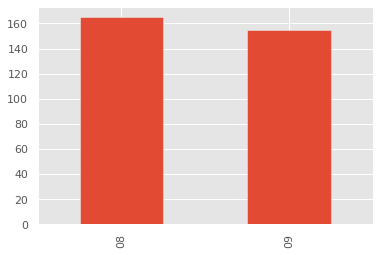

In [207]:
ypo_doc['Month'].value_counts().plot(kind='bar')

In [208]:
Keywords_data = ypo_doc.groupby(['Keywords']).count()['Title'].sort_values(ascending=False)


day_data = ypo_doc.groupby(['Day']).count()['Keywords']
(day_data,Keywords_data)

(Day
 01    19
 02     6
 03     6
 04     5
 05     7
 06     7
 07    10
 08    19
 09    10
 10     8
 11     8
 12     5
 13    10
 14    11
 15    13
 16     3
 17     8
 18     2
 19     6
 20     4
 21     2
 22    14
 23    10
 24    21
 25    21
 26    20
 27     6
 28     4
 29    18
 30    19
 31    18
 Name: Keywords, dtype: int64, Keywords
 ΥΠΟΚΛΟΠΕΣ               158
 ΣΥ.ΡΙΖ.Α.                19
 ΕΥΠ                      16
 ΠΑΣΟΚ                    15
 ΚΥΡΙΑΚΟΣ ΜΗΤΣΟΤΑΚΗΣ      14
 ΒΟΥΛΗ                    11
 ΚΥΒΕΡΝΗΣΗ                 9
 ΝΙΚΟΣ ΑΝΔΡΟΥΛΑΚΗΣ         8
 PREDATOR                  7
 ΝΕΑ ΔΗΜΟΚΡΑΤΙΑ            7
 ΑΛΕΞΗΣ ΤΣΙΠΡΑΣ            5
 ΚΩΣΤΑΣ ΚΑΡΑΜΑΝΛΗΣ         4
 ΜΗΤΣΟΤΑΚΗΣ ΔΕΘ            4
 ΔΙΚΑΙΟΣΥΝΗ                3
 Κ.Κ.Ε                     3
 ΝΑΣΟΣ ΗΛΙΟΠΟΥΛΟΣ          3
 ΔΕΘ 2022                  3
 ΓΙΑΝΝΗΣ ΟΙΚΟΝΟΜΟΥ         3
 ΓΙΩΡΓΟΣ ΚΑΤΡΟΥΓΚΑΛΟΣ      2
 ΛΑ ΓΚΡΕΚΑ ΜΠΕΛΕΤΣΑ        2
 ΑΔΩΝΙΣ ΓΕΩΡΓΙΑΔΗΣ         2
 ΟΛΓΑ ΚΕΦΑΛΟΓΙΑΝΝΗ         1
 ΚΥΡΙΑΚ

In [209]:
Keywords_data.head(10)
keywords_data = Keywords_data.head(10)
keywords_data

Keywords
ΥΠΟΚΛΟΠΕΣ              158
ΣΥ.ΡΙΖ.Α.               19
ΕΥΠ                     16
ΠΑΣΟΚ                   15
ΚΥΡΙΑΚΟΣ ΜΗΤΣΟΤΑΚΗΣ     14
ΒΟΥΛΗ                   11
ΚΥΒΕΡΝΗΣΗ                9
ΝΙΚΟΣ ΑΝΔΡΟΥΛΑΚΗΣ        8
PREDATOR                 7
ΝΕΑ ΔΗΜΟΚΡΑΤΙΑ           7
Name: Title, dtype: int64

In [210]:
day_data.head(31)
Day_data = day_data.head(31)
Day_data

Day
01    19
02     6
03     6
04     5
05     7
06     7
07    10
08    19
09    10
10     8
11     8
12     5
13    10
14    11
15    13
16     3
17     8
18     2
19     6
20     4
21     2
22    14
23    10
24    21
25    21
26    20
27     6
28     4
29    18
30    19
31    18
Name: Keywords, dtype: int64

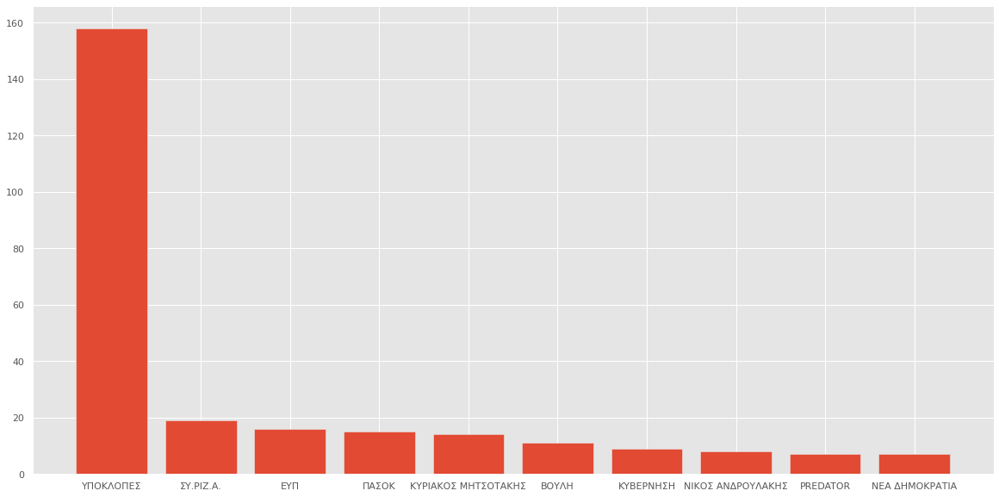

In [211]:
plt.figure(figsize=(20,10))
plt.bar(keywords_data.keys(),keywords_data,)
plt.show()


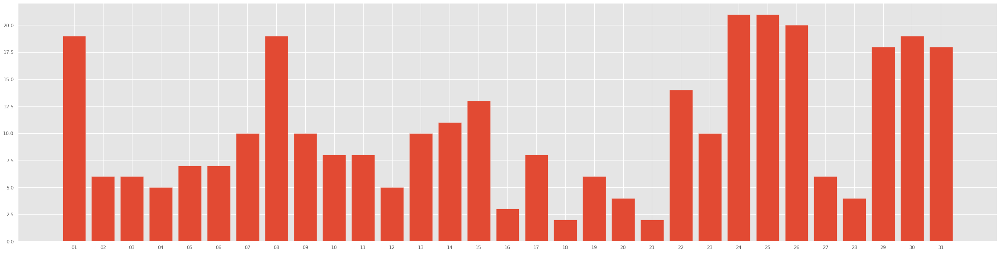

In [212]:
plt.figure(figsize=(40,10))
plt.bar(Day_data.keys(),Day_data,)
plt.show()

In [213]:
ypo_doc['Keywords'].unique()

array(['ΕΥΠ', 'ΣΥ.ΡΙΖ.Α.', 'ΥΠΟΚΛΟΠΕΣ', 'ΔΕΘ 2022', 'ΕΛΕΝΑ ΑΚΡΙΤΑ',
       'ΝΙΚΟΣ ΑΝΔΡΟΥΛΑΚΗΣ', 'ΚΥΡΙΑΚΟΣ ΜΗΤΣΟΤΑΚΗΣ', 'ΑΛΕΞΗΣ ΤΣΙΠΡΑΣ',
       'ΚΥΒΕΡΝΗΣΗ', 'ΝΕΑ ΔΗΜΟΚΡΑΤΙΑ', 'ΓΙΩΡΓΟΣ ΚΟΥΜΟΥΤΣΑΚΟΣ', 'ΒΟΥΛΗ',
       'PREDATOR', 'ΜΗΤΣΟΤΑΚΗΣ ΔΕΘ', 'ΠΑΣΟΚ', 'ΛΑ ΓΚΡΕΚΑ ΜΠΕΛΕΤΣΑ',
       'ΓΙΑΝΝΗΣ ΟΙΚΟΝΟΜΟΥ', 'ΧΡΗΣΤΟΣ ΣΠΙΡΤΖΗΣ', 'Κ.Κ.Ε',
       'ΕΥΡΩΠΑΪΚΗ ΕΝΩΣΗ', 'ΑΚΡΙΒΕΙΑ', 'ΕΚΛΟΓΙΚΟΣ ΝΟΜΟΣ', 'FUN',
       'ΔΙΚΑΙΟΣΥΝΗ', 'ΤΑΥΤΟΤΗΤΕΣ', 'ΚΩΣΤΑΣ ΚΑΡΑΜΑΝΛΗΣ', 'PODCASTS',
       'ΝΑΣΟΣ ΗΛΙΟΠΟΥΛΟΣ', 'ΠΡΟΚΟΠΗΣ ΠΑΥΛΟΠΟΥΛΟΣ', 'ΔΗΜΟΣ ΑΘΗΝΑΙΩΝ',
       'ΓΙΩΡΓΟΣ ΚΑΤΡΟΥΓΚΑΛΟΣ', 'ΘΕΟΔΩΡΟΣ ΡΟΥΣΟΠΟΥΛΟΣ', 'ΒΕΝΙΖΕΛΟΣ',
       'ΚΥΡΙΑΚΟΣ ΒΕΛΟΠΟΥΛΟΣ', 'ΔΗΜΗΤΡΗΣ ΚΟΥΤΣΟΥΜΠΑΣ',
       'ΓΙΩΡΓΟΣ ΓΕΡΑΠΕΤΡΙΤΗΣ', 'ΚΟΜΙΣΙΟΝ', 'ΓΙΑΝΗΣ ΒΑΡΟΥΦΑΚΗΣ',
       'ΑΔΩΝΙΣ ΓΕΩΡΓΙΑΔΗΣ', 'ΕΒΡΟΣ', 'ΕΦΗ ΑΧΤΣΙΟΓΛΟΥ', 'ΣΥΝΕΝΤΕΥΞΗ',
       'ΟΛΓΑ ΚΕΦΑΛΟΓΙΑΝΝΗ'], dtype=object)

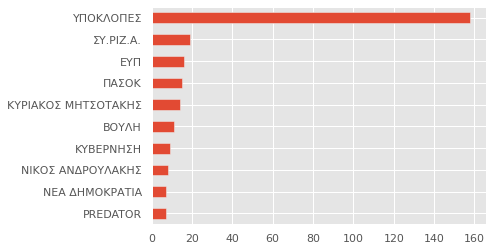

In [214]:
ypo_doc['Keywords'].value_counts().head(10).sort_values().plot(kind='barh')

# **Wordcloud**

In [215]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from wordcloud import WordCloud
from collections import Counter
from nltk.util import ngrams
import spacy
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import string
import seaborn as sns
import collections

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [216]:
!python -m spacy download el_core_news_sm

2022-09-17 12:17:32.557989: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.6 MB 30.3 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [217]:
nlp = spacy.load('el_core_news_sm')
nlp2 = spacy.load('en_core_web_sm')

greek_stopwords = list(nlp.Defaults.stop_words)

def custom_lemmatize_keywords(txt, nlp):
    words = nlp(txt)
    result = []
    for word in words:
        if word.text in ('ypoklopes', 'υποκλοπές', 'υποκλοπών', 'ypoklopon','υποκλοπη','υποκλοπες', 'υποκλοπων','υποκλοπές','Υποκλοπές'):
            result.append('υποκλοπές')
        else:
            result.append(word.text)
    return ' '.join(result)


In [218]:
def remove_stop_words(txt, nlp):
    words = nlp(txt)
    result = []
    for word in words:
        if word.text.lower() not in greek_stopwords:
            result.append(word.text)
    return ' '.join(result)
    

In [219]:
def lemmatize(txt, nlp):
    tokenized = nlp(txt)
    result = []
    for token in tokenized:
        result.append(token.lemma_)
    return ' '.join(result)

ypo_doc['text'] = ypo_doc.text.apply(lambda x: remove_stop_words(x, nlp))

In [220]:
ypo_doc['text'] = ypo_doc.text.apply(lambda x: custom_lemmatize_keywords(x, nlp))
ypo_doc['text'] = ypo_doc.text.apply(lambda x: custom_lemmatize_keywords(x, nlp2))

In [221]:
text = ypo_doc['text'].str.cat(sep = '.').replace('.','').strip()
text = text.replace('amp','').strip()
text = text.replace('rt','').strip()
text = text.replace('\n','').strip()
text = text.replace(':','').strip()
text

'Κοινό " μέτωπο " αντιπολίτευσης άμεση σύγκληση Επιτροπής Θεσμών Διαφάνειας βάζει αναφέρει ανακοίνωσή ΣΥΡΙΖΑ - ΠΣ  " αρχεία καταστρέψει κ  Μητσοτάκης μείνει κρυφό " εκπρόσωπος Τύπου ΣΥΡΙΖΑ τόνισε Αλέξης Τσίπρας δώσει προγραμματικούς άξονες προοδευτικής πολιτικής αλλαγής συμπλήρωσε προτεραιότητά αντιμετώπιση ακρίβειας πληθωρισμού " Αλλαγή πλεύσης " αφήγημα κυβέρνησης θέμα παρακολουθήσεων στόματος Άδωνι Γεωργιάδη  δίστασε επιτεθεί Νίκο Ανδρουλάκη διερωτώμενος " κατάλαβε συμβαίνουν ; " Magazine παρουσιάζει εσωτερικά email τιμολόγια εταιρειών Ταλ Ντίλιαν  Αποκαλύπτεται μοτίβο , ελληνική κυβέρνηση κλείνει μάτια καθηγητής Συνταγματικού Δικαίου πανεπιστήμιο Αθηνών , Γιώργος Σωτηρέλης γράφει NEWS 24/7 σημασία έργου ανεξάρτητων αρχών , σκανδάλου υποκλοπές Παύλος Γερουλάνος γράφει NEWS 24/7 υποκλοπές , διαχείριση αποκάλυψης διασυρμό χώρας διεθνώς προσδοκίες Αλέξη Τσίπρα , λάθη επαναληφθούν παράδειγμα " πρωθυπουργού Πρεσπών " Νίκος Παρασκευόπουλος γράφει NEWS 24/7 υπόθεση παρακολουθήσεων καθήκον 

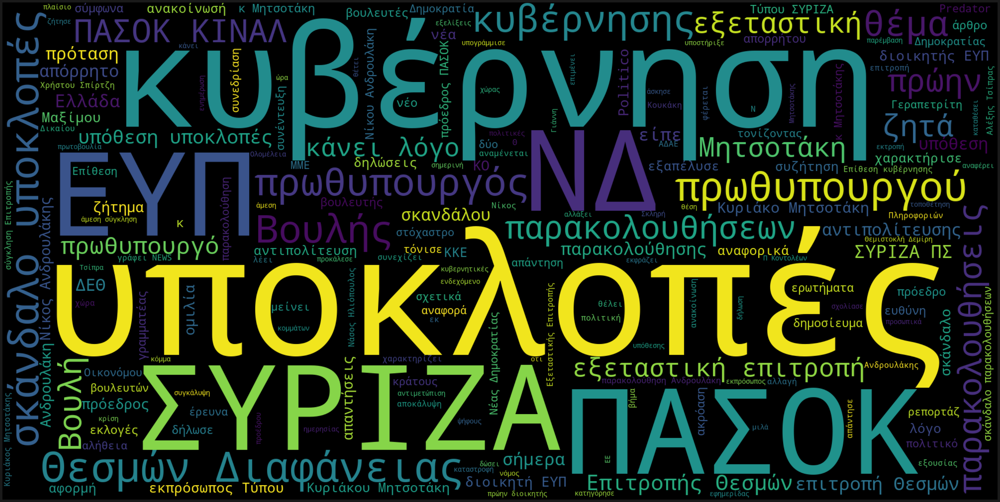

In [222]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

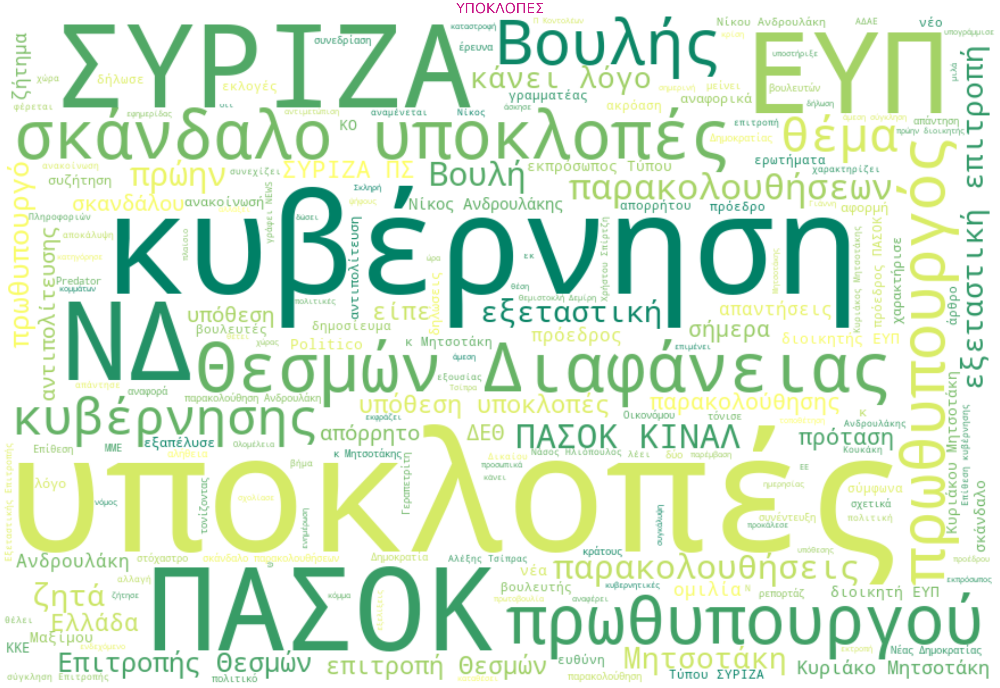

In [223]:
from PIL import Image
import numpy as np
mask = np.array(Image.open("/content/gdrive/My Drive/Colab Notebooks/Τελική Εργασία/ypo.jpeg")) 

def generate_name_wordcloud(data, title, mask=mask):
  wordcloud_name = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    scale=1,
    max_words=200,
    colormap='summer',
    mask=mask,
    background_color='white',
    collocations=True).generate(text)
  plt.figure(figsize = (40, 30))
  plt.imshow(wordcloud_name, interpolation = 'bilinear')
  plt.axis('off')
  plt.tight_layout(pad=2)
  plt.title("ΥΠΟΚΛΟΠΕΣ", size= 40, color='mediumvioletred')
  plt.savefig("name.png", format="png") 
  plt.show()
  
generate_name_wordcloud(text, '' , mask=mask)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


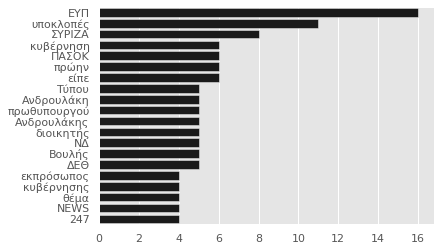

In [224]:
all_words = []
for txt in ypo_doc.text[:50]:
    txt_no_stopwords = remove_stop_words(txt, nlp)
    txt_no_punctuation = txt_no_stopwords.translate(str.maketrans('', '', string.punctuation + '…«»'))
    words = ngrams(txt_no_punctuation.split(), 1)
    all_words.extend(list(words))

yp_dict = collections.Counter(all_words)

yp_dict_sorted = sorted(yp_dict.items(), key=lambda kv: kv[1], reverse=True)
yp, counts = list(zip(*yp_dict_sorted))
yp = [b[0] for b in yp]
counts = list(counts)

top = 20
sns.barplot(counts[:top], yp[:top], orient='h',color=(0.1, 0.1, 0.1, 0.1))

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


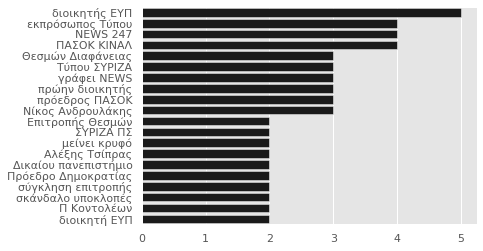

In [225]:
all_bigrams = []
for txt in ypo_doc.text[:50]:
    txt_no_punctuation = txt.translate(str.maketrans('', '', string.punctuation + '…«»'))
    bigrams = ngrams(txt_no_punctuation.split(), 2)
    all_bigrams.extend(list(bigrams))

yp_dict = collections.Counter(all_bigrams)

yp_dict_sorted = sorted(yp_dict.items(), key=lambda kv: kv[1], reverse=True)
yp, counts = list(zip(*yp_dict_sorted))
counts = list(counts)
yp_str = list(map(lambda x: ' '.join(x), yp))


top = 20
sns.barplot(counts[:top], yp_str[:top], orient='h', color=(0.1, 0.1, 0.1, 0.1),)

sns.set(rc={'figure.figsize':(15.7,13.27)})
plt.show()

In [226]:
ypo_doc['Date'] = ypo_doc.apply(lambda row: f'{row.Month}/{row.Day}/{row.Year} {row.Time}', axis='columns',result_type='expand')
ypo_doc['Date'] = pd.to_datetime(ypo_doc['Date'])
ypo_doc

,Title,created_at,URL,text,Keywords,Year,Month,Day,Time,Date
0,"ΣΥΡΙΖΑ για υποκλοπές: ""Όλη η αντιπολίτευση ζητ...",2022-09-17 15:05,https://www.news247.gr/politiki/syriza-gia-ypo...,"Κοινό "" μέτωπο "" αντιπολίτευσης άμεση σύγκληση...",ΕΥΠ,2022,09,17,15:05,2022-09-17 15:05:00
1,Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμ...,2022-09-17 12:30,https://www.news247.gr/politiki/nasos-iliopoyl...,εκπρόσωπος Τύπου ΣΥΡΙΖΑ τόνισε Αλέξης Τσίπρας ...,ΣΥ.ΡΙΖ.Α.,2022,09,17,12:30,2022-09-17 12:30:00
2,Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβ...,2022-09-17 10:55,https://www.news247.gr/politiki/o-adonis-georg...,""" Αλλαγή πλεύσης "" αφήγημα κυβέρνησης θέμα παρ...",ΥΠΟΚΛΟΠΕΣ,2022,09,17,10:55,2022-09-17 10:55:00
3,"Ο ""πατέρας"" του Predator κάνει στην Αθήνα ένα ...",2022-09-17 09:08,https://www.news247.gr/sunday-edition/o-patera...,Magazine παρουσιάζει εσωτερικά email τιμολόγια...,ΥΠΟΚΛΟΠΕΣ,2022,09,17,09:08,2022-09-17 09:08:00
4,"Με 6 ""Εθνικές Προτεραιότητες"" ο Τσίπρας στην ΔΕΘ",2022-09-17 07:38,https://www.news247.gr/politiki/me-6-ethnikes-...,,ΔΕΘ 2022,2022,09,17,07:38,2022-09-17 07:38:00
...,...,...,...,...,...,...,...,...,...,...
315,"""Κεφαλοκλείδωμα"" στο Μαξίμου για τις υποκλοπές",2022-08-19 06:24,https://www.news247.gr/politiki/kefalokleidoma...,Όλγα Κεφαλογιάννη έριξε τροχιοδεικτική βολή αφ...,ΟΛΓΑ ΚΕΦΑΛΟΓΙΑΝΝΗ,2022,08,19,06:24,2022-08-19 06:24:00
316,Η Εξεταστική για τις υποκλοπές να ξεκινήσει απ...,2022-08-19 06:09,https://www.news247.gr/gnomes/gerasimos-livits...,άμεση διαλεύκανση σκανδάλου κυβέρνηση προκρινε...,ΒΟΥΛΗ,2022,08,19,06:09,2022-08-19 06:09:00
317,"Οι ""κοριοί"" στον Ανδρουλάκη φέρνουν την πολιτι...",2022-08-19 06:09,https://www.news247.gr/gnomes/giwrgos-karelias...,"κανονικότητα πολιτική ζωή χώρας άρχισε 2011 , ...",ΥΠΟΚΛΟΠΕΣ,2022,08,19,06:09,2022-08-19 06:09:00
318,Σκάνδαλο υποκλοπών: Εκτενές αφιέρωμα και από τ...,2022-08-18 19:44,https://www.news247.gr/politiki/skandalo-ypokl...,μεγάλο διεθνές ΜΜΕ καταπιάστηκε σκάνδαλο υποκλ...,ΥΠΟΚΛΟΠΕΣ,2022,08,18,19:44,2022-08-18 19:44:00


In [227]:
ypo_doc.resample(rule='D',on='Date').count()

,Title,created_at,URL,text,Keywords,Year,Month,Day,Time,Date
Date,,,,,,,,,,
2022-08-18,2,2,2,2,2,2,2,2,2,2
2022-08-19,6,6,6,6,6,6,6,6,6,6
2022-08-20,4,4,4,4,4,4,4,4,4,4
2022-08-21,2,2,2,2,2,2,2,2,2,2
2022-08-22,14,14,14,14,14,14,14,14,14,14
2022-08-23,10,10,10,10,10,10,10,10,10,10
2022-08-24,21,21,21,21,21,21,21,21,21,21
2022-08-25,21,21,21,21,21,21,21,21,21,21
2022-08-26,20,20,20,20,20,20,20,20,20,20


# **Vectorizing**

In [228]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [229]:
count_vector = cv.fit_transform(ypo['text'])

In [230]:
count_vector.shape

(320, 2188)

In [231]:
cv.get_feature_names()

results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,00,11,142,17,187,19,1974,2011,2012,2015,...,όσα,όσο,όσων,όταν,ότι,όχι,ύφανε,ύφος,ώρα,ώστε
0,0,0,0,0,0,0,0,0,0,0,...,1,0,1,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [232]:
cv.vocabulary_

{'κοινό': 1165,
 'μέτωπο': 1280,
 'της': 1987,
 'αντιπολίτευσης': 288,
 'για': 508,
 'άμεση': 80,
 'σύγκληση': 1934,
 'επιτροπής': 885,
 'θεσμών': 997,
 'και': 1049,
 'διαφάνειας': 626,
 'βάζει': 445,
 'όσων': 2180,
 'αναφέρει': 239,
 'σε': 1759,
 'ανακοίνωσή': 223,
 'του': 2001,
 'συριζα': 1910,
 'πς': 1727,
 'όσα': 2178,
 'αρχεία': 402,
 'να': 1379,
 'καταστρέψει': 1106,
 'μητσοτάκης': 1327,
 'τίποτα': 1952,
 'δε': 545,
 'θα': 985,
 'μείνει': 1298,
 'κρυφό': 1195,
 'εκπρόσωπος': 732,
 'τύπου': 2026,
 'τόνισε': 2020,
 'πως': 1732,
 'αλέξης': 189,
 'τσίπρας': 2016,
 'δώσει': 685,
 'τους': 2004,
 'προγραμματικούς': 1652,
 'άξονες': 82,
 'προοδευτικής': 1672,
 'πολιτικής': 1614,
 'αλλαγής': 198,
 'ενώ': 799,
 'συμπλήρωσε': 1863,
 'προτεραιότητά': 1695,
 'είναι': 688,
 'αντιμετώπιση': 282,
 'ακρίβειας': 176,
 'πληθωρισμού': 1599,
 'αλλαγή': 197,
 'πλεύσης': 1598,
 'στο': 1819,
 'αφήγημα': 437,
 'κυβέρνησης': 1201,
 'το': 1991,
 'θέμα': 978,
 'των': 2018,
 'παρακολουθήσεων': 1516,
 'δια': 

In [233]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95)

In [234]:
count_vector = cv.fit_transform(ypo['text'])

In [235]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,24,news,politico,predator,times,άμεση,άρθρο,άσκησε,έρευνα,αδαε,...,υπόθεσης,φέρεται,χαρακτήρισε,χαρακτηρίζει,χρήστος,χρήστου,χώρα,χώρας,ψήφους,ώρα
0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [236]:
from html import unescape
def my_tokenizer(doc):
            
    doc_clean = unescape(doc).lower()
    tokens = nlp(doc_clean)
    lemmatized_tokens = [token.lemma_ for token in tokens if (len(str(token.lemma_))>2)]
            
    return(lemmatized_tokens)

In [252]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(ypo_doc['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['άρας', 'έκασε ο', 'έτερα', 'ήμω', 'ήσω', 'ίσιος', 'αλλαχούς', 'αλλιώτικος', 'αλλοιώτικας', 'αρκετός', 'γίνομαι', 'γρήγορος', 'δίπλας', 'είχος', 'εαυτής', 'εαυτός', 'εκάστος', 'εμένος', 'επόμενος', 'εσένος', 'εχτής', 'κάνενς', 'κάνω', 'λοιπός', 'μέλω', 'μερικός', 'μονομιά', 'μπορώ', 'μόνα', 'ολόγυρας', 'ορισμένος', 'ποία', 'πολύς', 'προτός', 'προχτής', 'σε ο', 'συχνά', 'ταύ', 'ταύτοταύτο', 'τουλάχιστος', 'τρίτος', 'τός', 'τόσοις'] not in stop_words.
  % sorted(inconsistent)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,,24/7,news,politico,predator,times,,Ελλάδα,άμεσος,άρθρο,...,υπουργικός,υπουργός,υπόθεση,φέρω,χαρακτηρίζω,χρήστοςς,χρήστου,χώρα,ψήφος,ώρα
0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [253]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, max_features=20) 
count_vector = cv.fit_transform(ypo_doc['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ανδρουλάκη,διαφάνειας,εξεταστική,επιτροπή,επιτροπής,ευπ,θεσμών,κυβέρνηση,κυβέρνησης,λόγο,μητσοτάκη,νδ,παρακολουθήσεων,πασοκ,πρωθυπουργού,πρώην,σκάνδαλο,συριζα,υποκλοπές,υπόθεση
0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [254]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, ngram_range=(2, 2) ) 
count_vector = cv.fit_transform(ypo_doc['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,news 24,διοικητή ευπ,διοικητής ευπ,εκπρόσωπος τύπου,εξεταστική επιτροπή,εξεταστική υποκλοπές,επιτροπή θεσμών,επιτροπής θεσμών,θεσμών διαφάνειας,κάνει λόγο,κυριάκο μητσοτάκη,κυριάκου μητσοτάκη,νίκος ανδρουλάκης,νίκου ανδρουλάκη,παρακολούθηση ανδρουλάκη,πασοκ κιναλ,πρόεδρος πασοκ,σκάνδαλο υποκλοπές,συριζα πς,υπόθεση υποκλοπές
0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0
1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [255]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, token_pattern = '\\bυποκλοπ[ές-η-ες-ή-ών-ων]*\\b', tokenizer=my_tokenizer)
count_vector = cv.fit_transform(ypo_doc['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['άρας', 'έκασε ο', 'έτερα', 'ήμω', 'ήσω', 'ίσιος', 'αλλαχούς', 'αλλιώτικος', 'αλλοιώτικας', 'αρκετός', 'γίνομαι', 'γρήγορος', 'δίπλας', 'είχος', 'εαυτής', 'εαυτός', 'εκάστος', 'εμένος', 'επόμενος', 'εσένος', 'εχτής', 'κάνενς', 'κάνω', 'λοιπός', 'μέλω', 'μερικός', 'μονομιά', 'μπορώ', 'μόνα', 'ολόγυρας', 'ορισμένος', 'ποία', 'πολύς', 'προτός', 'προχτής', 'σε ο', 'συχνά', 'ταύ', 'ταύτοταύτο', 'τουλάχιστος', 'τρίτος', 'τός', 'τόσοις'] not in stop_words.
  % sorted(inconsistent)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ανδρουλάκη,διαφάνεια,εξεταστικός,επιτροπή,ευπ,θεσμών,κυβέρνηση,λόγος,μητσοτάκη,νέος,παρακολουθήσεων,παρακολούθηση,πασοκ,πολιτικός,πρωθυπουργός,πρόεδρος,σκάνδαλο,συριζα,υποκλοπή,υπόθεση
0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
2,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [257]:
results.sum(axis =0).sort_values(ascending = False)

υποκλοπή           97
κυβέρνηση          77
πρωθυπουργός       61
επιτροπή           60
πασοκ              60
συριζα             55
ευπ                51
ανδρουλάκη         42
μητσοτάκη          42
σκάνδαλο           41
εξεταστικός        37
νέος               33
πολιτικός          32
λόγος              31
υπόθεση            30
θεσμών             29
πρόεδρος           27
διαφάνεια          27
παρακολούθηση      26
παρακολουθήσεων    25
dtype: int64

In [258]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head()

υποκλοπή        97
κυβέρνηση       77
πρωθυπουργός    61
επιτροπή        60
πασοκ           60
dtype: int64

In [259]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, ngram_range=(1, 2), 
                    token_pattern = '(\\bυποκλοπ[ές-η-ες-ή-ών-ων]+\\b)', tokenizer=my_tokenizer)
count_vector = cv.fit_transform(ypo_doc['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['άρας', 'έκασε ο', 'έτερα', 'ήμω', 'ήσω', 'ίσιος', 'αλλαχούς', 'αλλιώτικος', 'αλλοιώτικας', 'αρκετός', 'γίνομαι', 'γρήγορος', 'δίπλας', 'είχος', 'εαυτής', 'εαυτός', 'εκάστος', 'εμένος', 'επόμενος', 'εσένος', 'εχτής', 'κάνενς', 'κάνω', 'λοιπός', 'μέλω', 'μερικός', 'μονομιά', 'μπορώ', 'μόνα', 'ολόγυρας', 'ορισμένος', 'ποία', 'πολύς', 'προτός', 'προχτής', 'σε ο', 'συχνά', 'ταύ', 'ταύτοταύτο', 'τουλάχιστος', 'τρίτος', 'τός', 'τόσοις'] not in stop_words.
  % sorted(inconsistent)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ανδρουλάκη,διαφάνεια,εξεταστικός,επιτροπή,επιτροπή θεσμών,ευπ,θεσμών,κυβέρνηση,λόγος,μητσοτάκη,νέος,παρακολούθηση,πασοκ,πολιτικός,πρωθυπουργός,πρόεδρος,σκάνδαλο,συριζα,υποκλοπή,υπόθεση
0,0,1,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
2,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [260]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, 
                     vocabulary = ['υποκλοπές', 'κυβέρνηση', 'ανδρουλάκης', 'μητσοτάκης']) 
count_vector = cv.fit_transform(ypo_doc['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,υποκλοπές,κυβέρνηση,ανδρουλάκης,μητσοτάκης
0,0,0,0,1
1,0,0,0,0
2,0,0,0,0
3,0,1,0,0
4,0,0,0,0


In [262]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vectorizer = TfidfVectorizer(stop_words= nlp.Defaults.stop_words, max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(ypo_doc['text'])  

In [263]:
results = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names()) 

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [264]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train)) 

cosine scores ==>  [[1.         0.02780569 0.         0.         0.         0.
  0.         0.         0.         0.         0.13136591 0.31896487
  0.03280533 0.         0.03630806 0.         0.         0.
  0.15964858 0.         0.         0.13886668 0.         0.
  0.         0.         0.         0.10116078 0.         0.35054255
  0.         0.08926037 0.         0.         0.15862013 0.06005035
  0.10837792 0.         0.         0.07761865 0.         0.
  0.         0.         0.         0.         0.         0.02976986
  0.0447421  0.         0.03862648 0.         0.         0.
  0.         0.06477774 0.10166577 0.         0.0280961  0.07200968
  0.         0.         0.         0.         0.         0.02400063
  0.03996738 0.26066983 0.         0.03247336 0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.04601104 0.04342195 0.         0.
  0.         0.029708   0.07122944 0.03738322 0.         0.
  0.         0.         0.       

In [277]:
print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train, tfidf_matrix_train))

cosine scores ==>  [[1.         0.02780569 0.         ... 0.         0.         0.31659857]
 [0.02780569 1.         0.         ... 0.         0.         0.03620491]
 [0.         0.         1.         ... 0.         0.18714003 0.        ]
 ...
 [0.         0.         0.         ... 1.         0.02212819 0.        ]
 [0.         0.         0.18714003 ... 0.02212819 1.         0.        ]
 [0.31659857 0.03620491 0.         ... 0.         0.         1.        ]]


In [278]:
similarity_df = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)

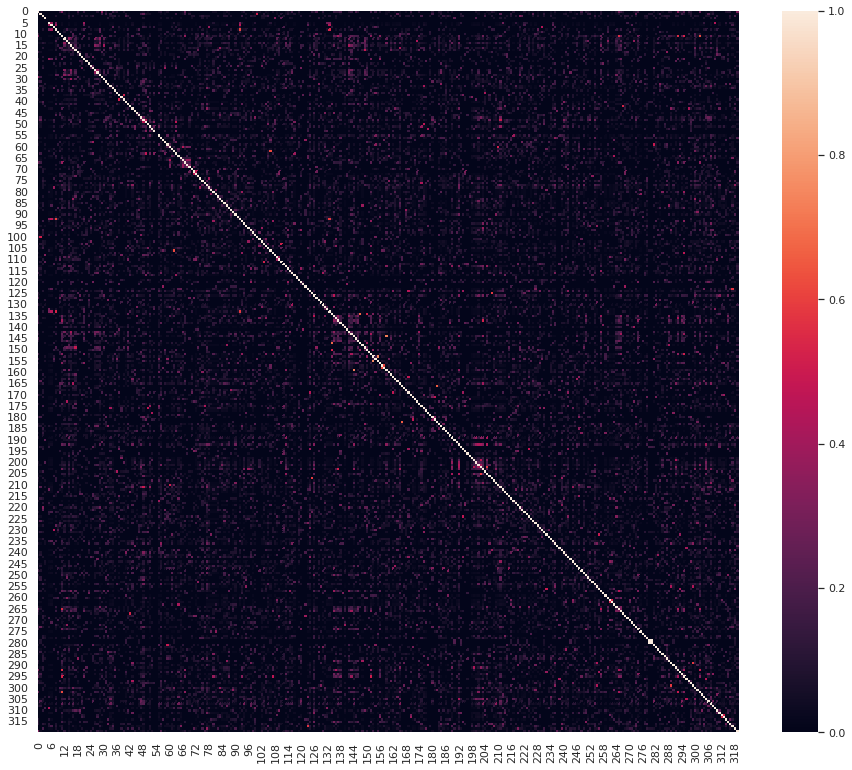

In [266]:
sns.heatmap(similarity_df)

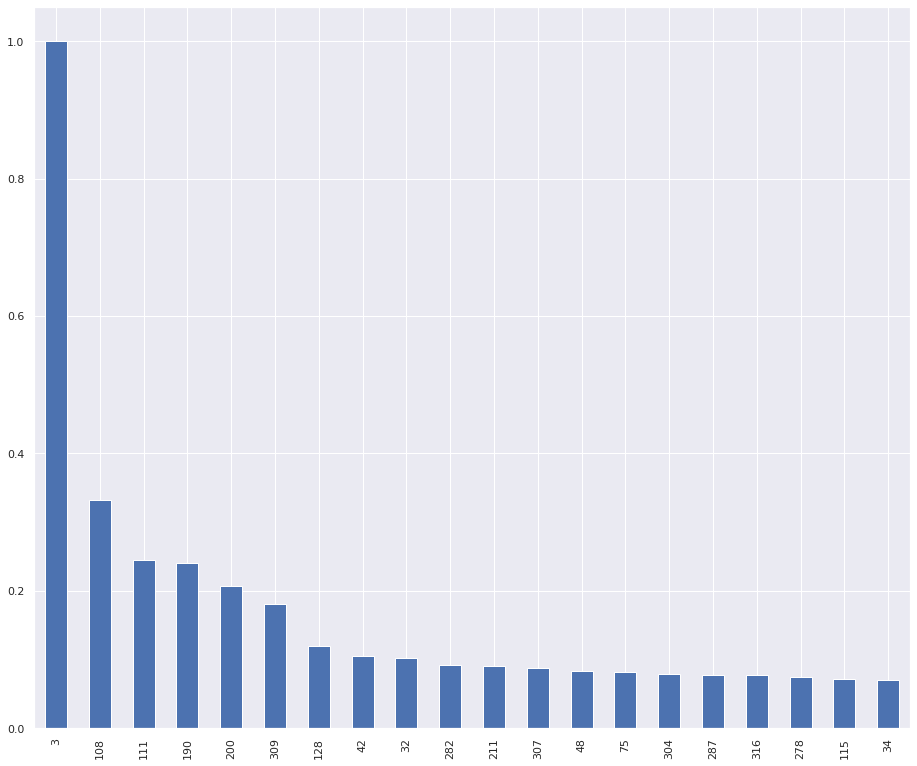

In [267]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)
pd.DataFrame(arr).loc[3].sort_values(ascending = False).head(20).plot(kind = 'bar')

In [269]:
ypo_doc['text'].loc[3]

'Magazine παρουσιάζει εσωτερικά email τιμολόγια εταιρειών Ταλ Ντίλιαν . Αποκαλύπτεται μοτίβο , ελληνική κυβέρνηση κλείνει μάτια .'

In [270]:
ypo_doc['text'].loc[253]

'Γενικός Γραμματέας ΜέΡΑ25 ζητά Χρήστο Ράμμο ενημέρωση προβλέπει νόμος " λάβει " τοποθετηθεί Βουλή άρσεις απορρήτου .'

# **Emolex**

In [416]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week10/NRC_GREEK_Translated_6_2020.csv"
emolex_df = pd.read_csv(filepath)
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(drop = True, inplace = True)
emolex_df

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [417]:
import spacy
nlp = spacy.load('el_core_news_sm')

In [418]:
ypo_df = pd.read_csv("/content/gdrive/My Drive/Colab Notebooks/ypoklopes.tsv", sep='\t')
ypo_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time
0,0,"ΣΥΡΙΖΑ για υποκλοπές: ""Όλη η αντιπολίτευση ζητ...",2022-09-17 15:05,https://www.news247.gr/politiki/syriza-gia-ypo...,"Κοινό ""μέτωπο"" της αντιπολίτευσης για άμεση σύ...",ΕΥΠ,2022,9,17,15:05
1,1,Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμ...,2022-09-17 12:30,https://www.news247.gr/politiki/nasos-iliopoyl...,Ο εκπρόσωπος Τύπου του ΣΥΡΙΖΑ τόνισε πως ο Αλέ...,ΣΥ.ΡΙΖ.Α.,2022,9,17,12:30
2,2,Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβ...,2022-09-17 10:55,https://www.news247.gr/politiki/o-adonis-georg...,"""Αλλαγή πλεύσης"" στο αφήγημα της κυβέρνησης γι...",ΥΠΟΚΛΟΠΕΣ,2022,9,17,10:55
3,3,"Ο ""πατέρας"" του Predator κάνει στην Αθήνα ένα ...",2022-09-17 09:08,https://www.news247.gr/sunday-edition/o-patera...,Το Magazine παρουσιάζει εσωτερικά email και τι...,ΥΠΟΚΛΟΠΕΣ,2022,9,17,09:08
4,4,"Με 6 ""Εθνικές Προτεραιότητες"" ο Τσίπρας στην ΔΕΘ",2022-09-17 07:38,https://www.news247.gr/politiki/me-6-ethnikes-...,NaN,ΔΕΘ 2022,2022,9,17,07:38
...,...,...,...,...,...,...,...,...,...,...
315,315,"""Κεφαλοκλείδωμα"" στο Μαξίμου για τις υποκλοπές",2022-08-19 06:24,https://www.news247.gr/politiki/kefalokleidoma...,Η Όλγα Κεφαλογιάννη έριξε μία τροχιοδεικτική β...,ΟΛΓΑ ΚΕΦΑΛΟΓΙΑΝΝΗ,2022,8,19,06:24
316,316,Η Εξεταστική για τις υποκλοπές να ξεκινήσει απ...,2022-08-19 06:09,https://www.news247.gr/gnomes/gerasimos-livits...,Αντί για άμεση διαλεύκανση του σκανδάλου η κυβ...,ΒΟΥΛΗ,2022,8,19,06:09
317,317,"Οι ""κοριοί"" στον Ανδρουλάκη φέρνουν την πολιτι...",2022-08-19 06:09,https://www.news247.gr/gnomes/giwrgos-karelias...,Από την μη κανονικότητα στην πολιτική ζωή της ...,ΥΠΟΚΛΟΠΕΣ,2022,8,19,06:09
318,318,Σκάνδαλο υποκλοπών: Εκτενές αφιέρωμα και από τ...,2022-08-18 19:44,https://www.news247.gr/politiki/skandalo-ypokl...,Ένα ακόμα μεγάλο διεθνές ΜΜΕ καταπιάστηκε με τ...,ΥΠΟΚΛΟΠΕΣ,2022,8,18,19:44


In [419]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [420]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word, 
                      strip_accents = 'unicode',  
                      stop_words= nlp.Defaults.stop_words,
                      ngram_range=(1, 2))

In [421]:
matrix = vec.fit_transform(ypo_df['text'].values.astype('U'))
vocab = vec.get_feature_names()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [422]:
wordcount_df.shape

(320, 13161)

In [423]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [424]:
emolex_df[emolex_df.Anger == 1].tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13094,διεξοδος,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13096,ζωυφια,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
13100,θυματοποιω,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0
13128,αποτυχημενος,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [425]:
#angry words
angry_words = emolex_df[emolex_df.Anger == 1]['word']

#positive words
positive_words = emolex_df[emolex_df.Positive == 1]['word']

#sad words
sad_words = emolex_df[emolex_df.Sadness == 1]['word']

#surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']

#disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']

#anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']

#negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']

#joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']

#trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']

#fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']

In [426]:
ypo_df.head(3)

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time
0,0,"ΣΥΡΙΖΑ για υποκλοπές: ""Όλη η αντιπολίτευση ζητ...",2022-09-17 15:05,https://www.news247.gr/politiki/syriza-gia-ypo...,"Κοινό ""μέτωπο"" της αντιπολίτευσης για άμεση σύ...",ΕΥΠ,2022,9,17,15:05
1,1,Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμ...,2022-09-17 12:30,https://www.news247.gr/politiki/nasos-iliopoyl...,Ο εκπρόσωπος Τύπου του ΣΥΡΙΖΑ τόνισε πως ο Αλέ...,ΣΥ.ΡΙΖ.Α.,2022,9,17,12:30
2,2,Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβ...,2022-09-17 10:55,https://www.news247.gr/politiki/o-adonis-georg...,"""Αλλαγή πλεύσης"" στο αφήγημα της κυβέρνησης γι...",ΥΠΟΚΛΟΠΕΣ,2022,9,17,10:55


In [427]:
ypo_df['anger'] = wordcount_df[angry_words].sum(axis=1)
ypo_df['positivity'] = wordcount_df[positive_words].sum(axis=1)
ypo_df['joy'] = wordcount_df[joy_words].sum(axis=1)
ypo_df['disgust'] = wordcount_df[disgust_words].sum(axis=1)
ypo_df['surprise'] = wordcount_df[surprise_words].sum(axis=1)
ypo_df['trust'] = wordcount_df[trust_words].sum(axis=1)
ypo_df['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)
ypo_df['sadness'] = wordcount_df[sad_words].sum(axis=1)
ypo_df['negative'] = wordcount_df[negative_words].sum(axis=1)
ypo_df['fear'] = wordcount_df[fear_words].sum(axis=1)

In [428]:
ypo_df['Date'] = ypo_df.apply(lambda row: f'{row.Month}/{row.Day}/{row.Year} {row.Time}', axis='columns',result_type='expand')
ypo_df['Date'] = pd.to_datetime(ypo_df['Date'])


In [429]:
ypo_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,...,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear,Date
0,0,"ΣΥΡΙΖΑ για υποκλοπές: ""Όλη η αντιπολίτευση ζητ...",2022-09-17 15:05,https://www.news247.gr/politiki/syriza-gia-ypo...,"Κοινό ""μέτωπο"" της αντιπολίτευσης για άμεση σύ...",ΕΥΠ,2022,9,17,15:05,...,0,0,0,0,0,2,0,0,0,2022-09-17 15:05:00
1,1,Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμ...,2022-09-17 12:30,https://www.news247.gr/politiki/nasos-iliopoyl...,Ο εκπρόσωπος Τύπου του ΣΥΡΙΖΑ τόνισε πως ο Αλέ...,ΣΥ.ΡΙΖ.Α.,2022,9,17,12:30,...,0,0,0,0,1,0,0,0,0,2022-09-17 12:30:00
2,2,Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβ...,2022-09-17 10:55,https://www.news247.gr/politiki/o-adonis-georg...,"""Αλλαγή πλεύσης"" στο αφήγημα της κυβέρνησης γι...",ΥΠΟΚΛΟΠΕΣ,2022,9,17,10:55,...,0,0,0,0,1,0,0,1,1,2022-09-17 10:55:00
3,3,"Ο ""πατέρας"" του Predator κάνει στην Αθήνα ένα ...",2022-09-17 09:08,https://www.news247.gr/sunday-edition/o-patera...,Το Magazine παρουσιάζει εσωτερικά email και τι...,ΥΠΟΚΛΟΠΕΣ,2022,9,17,09:08,...,1,0,0,0,1,0,0,1,1,2022-09-17 09:08:00
4,4,"Με 6 ""Εθνικές Προτεραιότητες"" ο Τσίπρας στην ΔΕΘ",2022-09-17 07:38,https://www.news247.gr/politiki/me-6-ethnikes-...,NaN,ΔΕΘ 2022,2022,9,17,07:38,...,0,0,0,0,0,0,0,0,0,2022-09-17 07:38:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315,315,"""Κεφαλοκλείδωμα"" στο Μαξίμου για τις υποκλοπές",2022-08-19 06:24,https://www.news247.gr/politiki/kefalokleidoma...,Η Όλγα Κεφαλογιάννη έριξε μία τροχιοδεικτική β...,ΟΛΓΑ ΚΕΦΑΛΟΓΙΑΝΝΗ,2022,8,19,06:24,...,0,0,0,1,1,0,1,1,1,2022-08-19 06:24:00
316,316,Η Εξεταστική για τις υποκλοπές να ξεκινήσει απ...,2022-08-19 06:09,https://www.news247.gr/gnomes/gerasimos-livits...,Αντί για άμεση διαλεύκανση του σκανδάλου η κυβ...,ΒΟΥΛΗ,2022,8,19,06:09,...,2,0,0,0,1,1,0,1,1,2022-08-19 06:09:00
317,317,"Οι ""κοριοί"" στον Ανδρουλάκη φέρνουν την πολιτι...",2022-08-19 06:09,https://www.news247.gr/gnomes/giwrgos-karelias...,Από την μη κανονικότητα στην πολιτική ζωή της ...,ΥΠΟΚΛΟΠΕΣ,2022,8,19,06:09,...,1,0,0,0,2,2,0,0,0,2022-08-19 06:09:00
318,318,Σκάνδαλο υποκλοπών: Εκτενές αφιέρωμα και από τ...,2022-08-18 19:44,https://www.news247.gr/politiki/skandalo-ypokl...,Ένα ακόμα μεγάλο διεθνές ΜΜΕ καταπιάστηκε με τ...,ΥΠΟΚΛΟΠΕΣ,2022,8,18,19:44,...,1,0,0,0,1,0,0,1,1,2022-08-18 19:44:00


In [430]:
max = 0
happiest_art = ""
for i in range(0,len(ypo_df)):
  if ypo_df.iloc[i]['positivity'] > max:
    happiest_art = ypo_df.iloc[i]['text']
    max = ypo_df.iloc[i]['positivity']


happiest_art

'Τα μηνύματα του πρωθυπουργού στο υπουργικό συμβούλιο. Οι υποκλοπές στη Βουλή, προτεραιότητα της κυβέρνησης η ενεργειακή κρίση, υπομονή μέχρι τη ΔΕΘ για μέτρα, δήλωσε. Υποστήριξε ότι Πούτιν και Ερντογάν θέλουν αστάθεια και άλλη κυβέρνηση στην Ελλάδα'

In [431]:
max = 0
negative_art = ""
for i in range(0,len(ypo_df)):
  if ypo_df.iloc[i]['negative'] > max:
    negative_art = ypo_df.iloc[i]['text']
    max = ypo_df.iloc[i]['negative']


negative_art

'Αν η\xa0κυβέρνηση δεν ήταν ένοχη, οι κύριοι Δημητριάδης και Κοντολέων θα έδιναν καθαρές\xa0απαντήσεις, αποστομώνοντας την αντιπολίτευση και δίνοντας τέλος στην πλέον σοβαρή\xa0κρίση που έχει αντιμετωπίσει η κυβέρνηση Μητσοτάκη.'

In [432]:
max = 0
saddest_art = ""
for i in range(0,len(ypo_df)):
  if ypo_df.iloc[i]['sadness'] > max:
    saddest_art = ypo_df.iloc[i]['text']
    max = ypo_df.iloc[i]['sadness']

saddest_art

'Πυρά κατά της κυβέρνησης από τον Δημήτρη Τζανακόπουλο για την υπόθεση των υποκλοπών, μετά την απόρριψη της πρότασης της αντιπολίτευσης για πολιτικομματικό προεδρείο που απέρριψαν οι βουλευτές της ΝΔ.'

In [433]:
max = 0
fear_art = ""
for i in range(0,len(ypo_df)):
  if ypo_df.iloc[i]['fear'] > max:
    fear_art = ypo_df.iloc[i]['text']
    max = ypo_df.iloc[i]['fear']

fear_art

'Η κυβέρνηση Μητσοτάκη επιχειρεί να συγκαλύψει το σκάνδαλο των υποκλοπών, ενώ αν ισχύει ότι έχουν καταστραφεί τα στοιχεία της ΕΥΠ για τις παρακολουθήσεις Ανδρουλάκη-Κουκάκη, πρόκειται για σκάνδαλο μέσα στο σκάνδαλο.'

In [434]:
max = 0
trust_art = ""
for i in range(0,len(ypo_df)):
  if ypo_df.iloc[i]['trust'] > max:
    trust_art = ypo_df.iloc[i]['text']
    max = ypo_df.iloc[i]['trust']

trust_art

'Ανοιχτό άφησε ο κυβερνητικός εκπρόσωπος το ενδεχόμενο να αλλάξει το υφιστάμενο νομικό πλαίσιο που θεσμοθέτησε η κυβέρνηση, ώστε ο Νίκος Ανδρουλάκης να ενημερωθεί από τον αρχηγό της ΕΥΠ για την σε βάρος του παρακολούθηση'

In [435]:
ypo_df.set_index('Date', inplace=True)

In [436]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

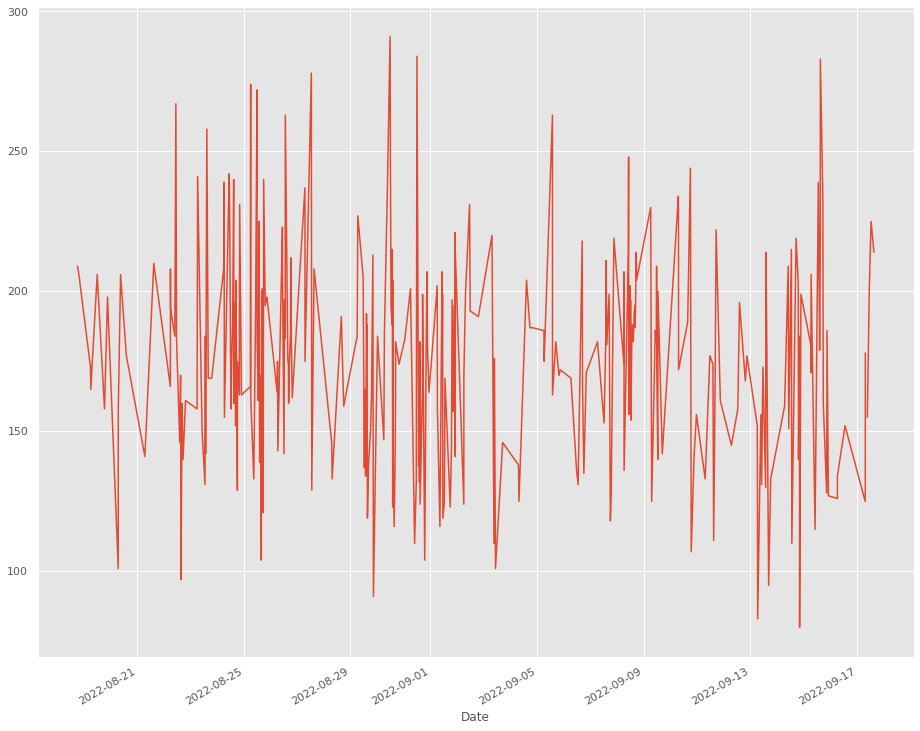

In [437]:
ypo_df['text'].str.len().groupby(by=ypo_df.index).mean().plot()

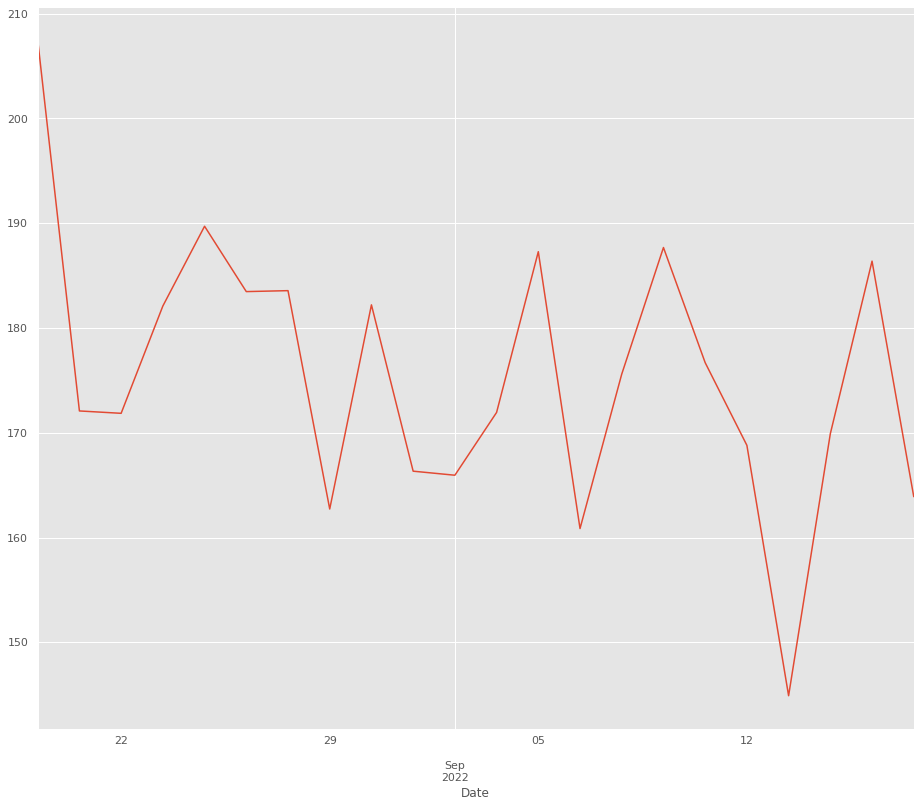

In [438]:
ypo_df['text'].str.len().resample('B').mean().plot()

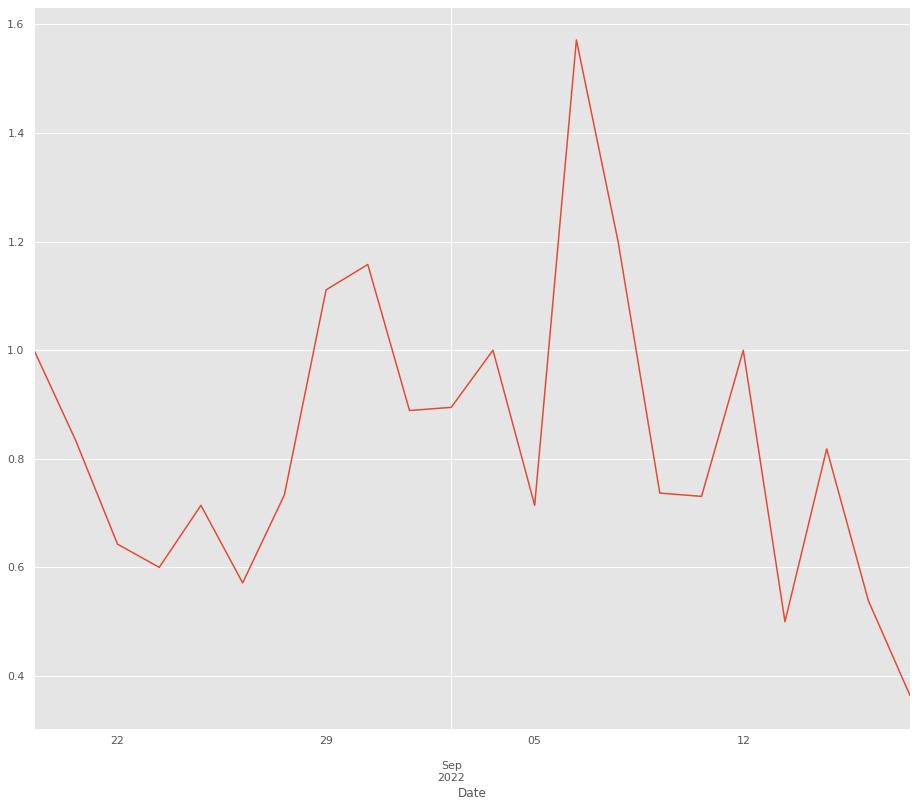

In [439]:
ypo_df['positivity'].resample('B').mean().plot()

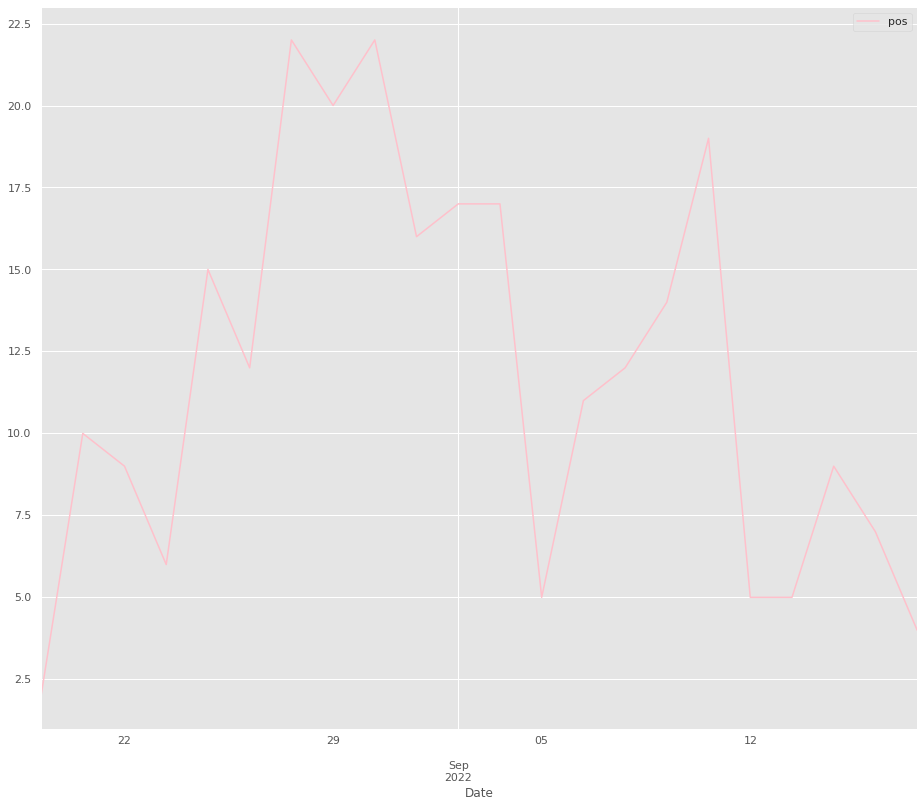

In [440]:
ypo_df['positivity'].resample('B').sum().plot(color = 'pink',label = 'pos').legend() 

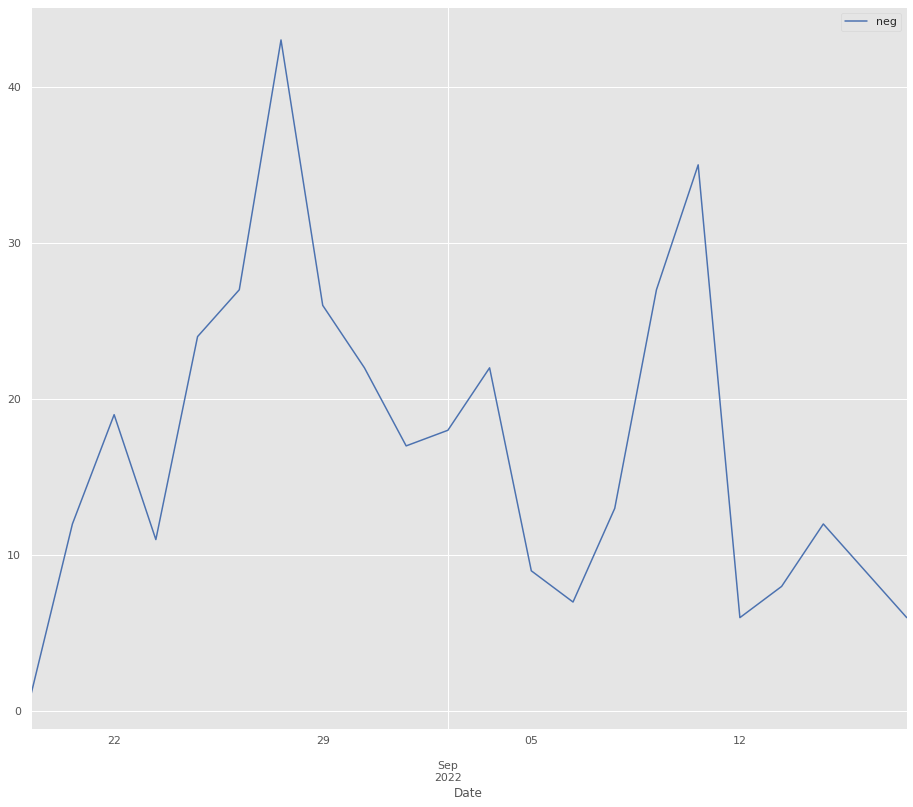

In [441]:
ypo_df['negative'].resample('B').sum().plot(color = 'b',label = 'neg').legend() 

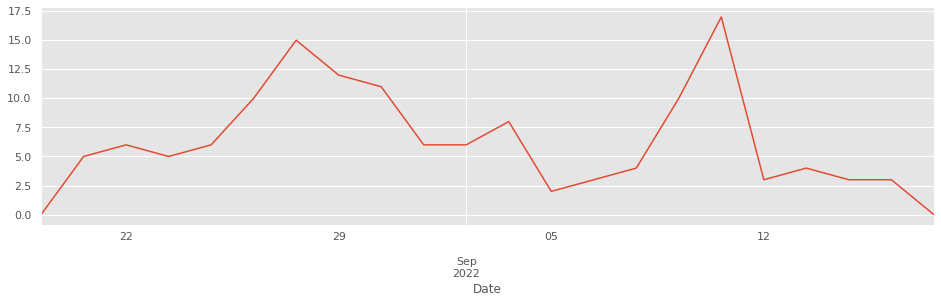

In [456]:
ypo_df['anger'].resample('B').sum().plot(figsize=(16,4))

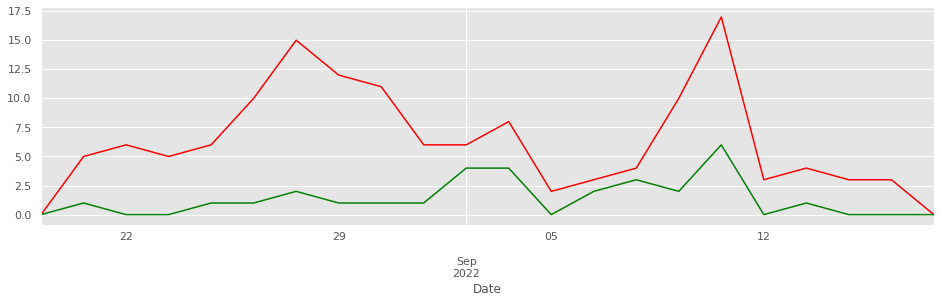

In [670]:
ax = ypo_df['anger'].resample('b').sum().plot(figsize=(16,4), color = 'red', label = 'anger')
ypo_df['joy'].resample('b').sum().plot(figsize=(16,4), ax = ax, color = 'green', label = 'joy')

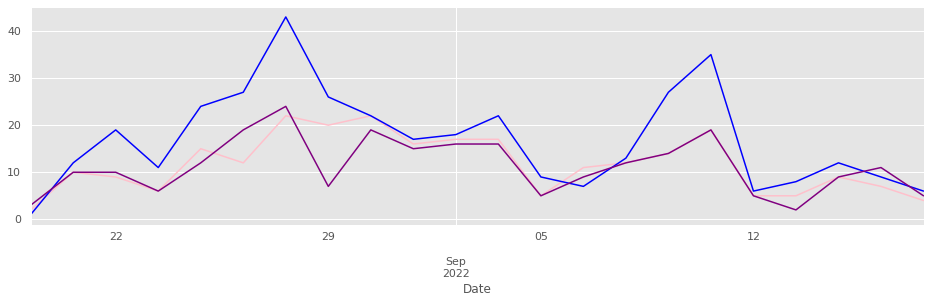

In [454]:
ax = ypo_df['positivity'].resample('B').sum().plot(figsize=(16,4), color = 'pink')
ypo_df['negative'].resample('B').sum().plot(figsize=(16,4), ax = ax, color = 'blue')
ypo_df['trust'].resample('B').sum().plot(figsize=(16,4), ax = ax, color = 'purple')

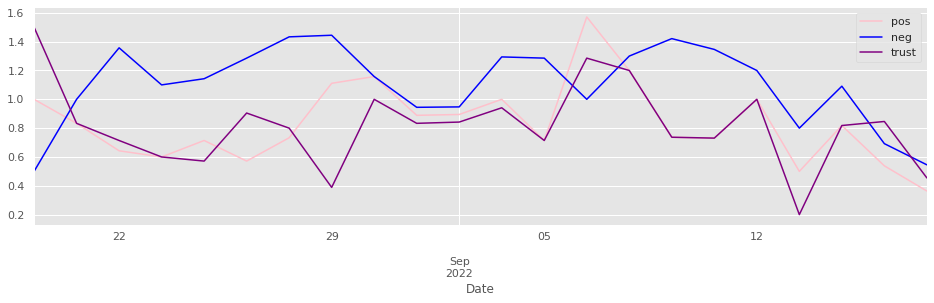

In [453]:
ax = ypo_df['positivity'].resample('B').mean().plot(figsize=(16,4), 
                                                          color = 'pink', label='pos')
ypo_df['negative'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'blue')
ypo_df['trust'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'purple').legend()

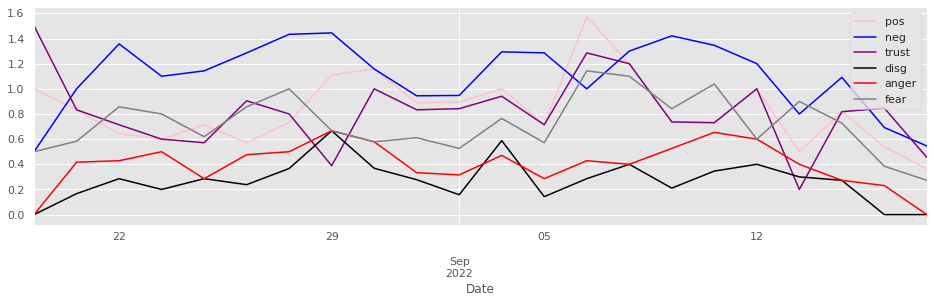

In [452]:
plt.style.use('ggplot')
ax = ypo_df['positivity'].resample('B').mean().plot(figsize=(16,4), 
                                                          color = 'pink', label='pos')
ypo_df['negative'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'blue')
ypo_df['trust'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'purple').legend()

ypo_df['disgust'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'disg',color = 'black').legend() 

ypo_df['anger'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'anger',color = 'red').legend() 

ypo_df['fear'].resample('B').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'fear',color = 'gray').legend()    

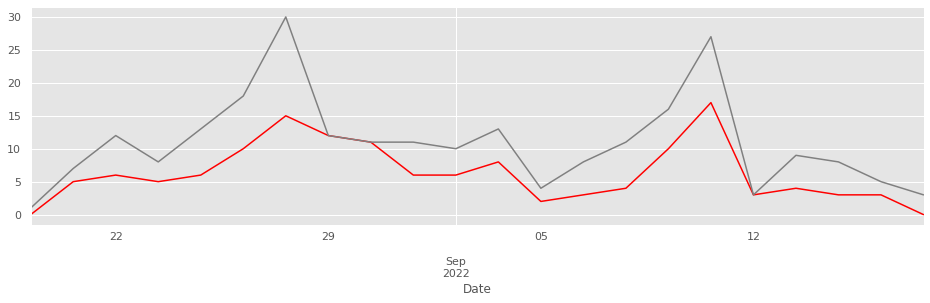

In [473]:
ax = ypo_df['anger'].resample('b').sum().plot(figsize=(16,4), color = 'red')
ypo_df['fear'].resample('b').sum().plot(figsize=(16,4), ax = ax, color = 'gray')

Text(0, 0.5, 'Months')

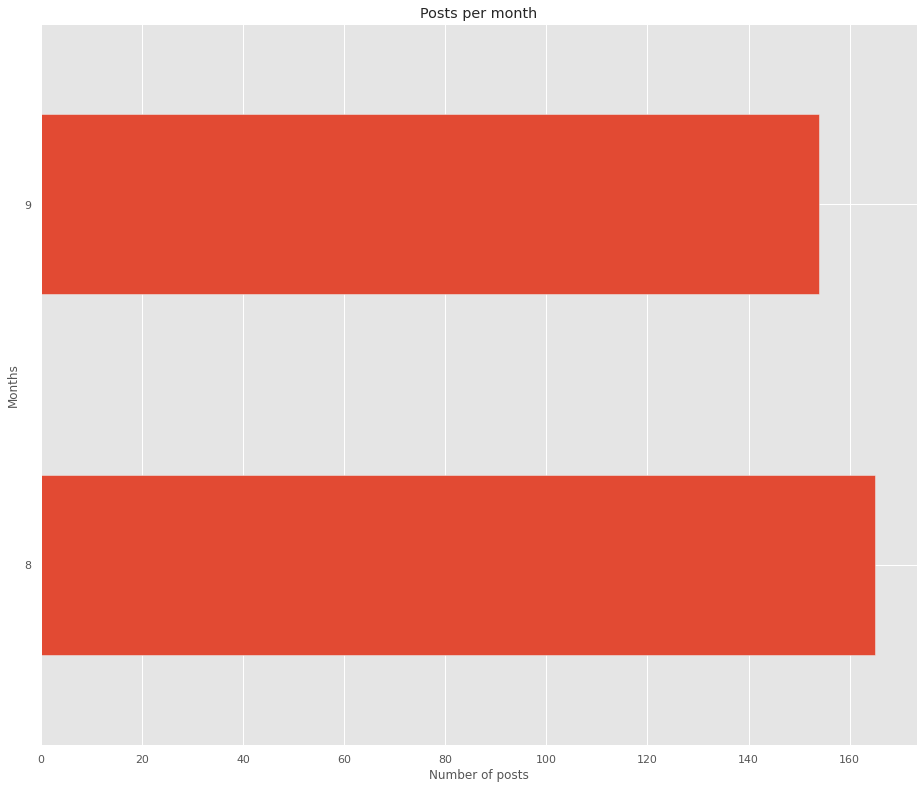

In [459]:
ypo_df['text'].groupby(by=ypo_df.index.month).count().plot(kind='barh')
plt.title("Posts per month")
plt.xlabel("Number of posts")
plt.ylabel("Months")

Text(0, 0.5, 'Hour of the day')

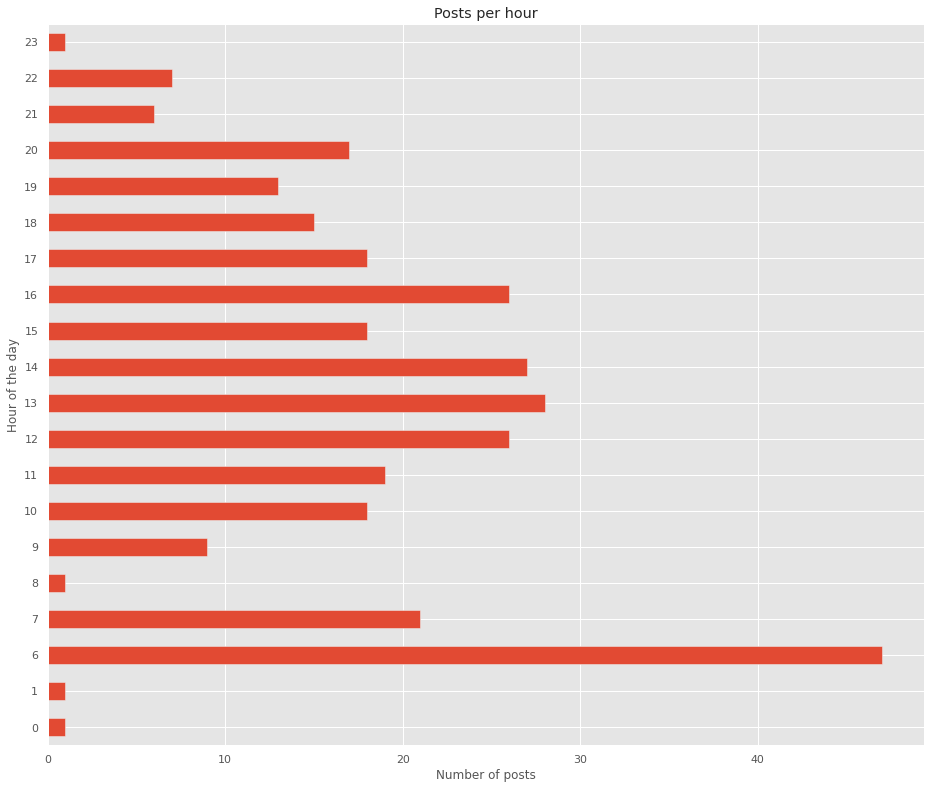

In [460]:
ypo_df['text'].groupby(by=ypo_df.index.hour).count().plot(kind='barh')
plt.title("Posts per hour")
plt.xlabel("Number of posts")
plt.ylabel("Hour of the day")

Text(0, 0.5, 'Days')

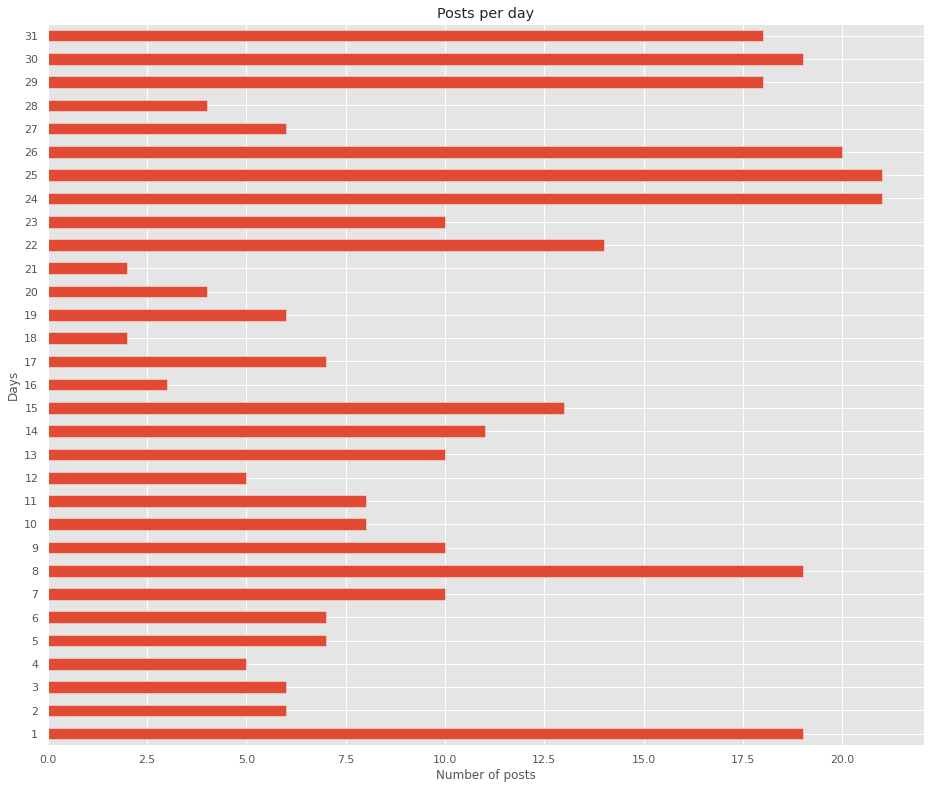

In [463]:
ypo_df['text'].groupby(by=ypo_df.index.day).count().plot(kind='barh')
plt.title("Posts per day")
plt.xlabel("Number of posts")
plt.ylabel("Days")

In [464]:
ypo_df

,Unnamed: 0,Title,created_at,URL,text,About_text,Year,Month,Day,Time,anger,positivity,joy,disgust,surprise,trust,anticipation,sadness,negative,fear
Date,,,,,,,,,,,,,,,,,,,,
2022-09-17 15:05:00,0,"ΣΥΡΙΖΑ για υποκλοπές: ""Όλη η αντιπολίτευση ζητ...",2022-09-17 15:05,https://www.news247.gr/politiki/syriza-gia-ypo...,"Κοινό ""μέτωπο"" της αντιπολίτευσης για άμεση σύ...",ΕΥΠ,2022,9,17,15:05,0,0,0,0,0,0,2,0,0,0
2022-09-17 12:30:00,1,Νάσος Ηλιόπουλος: Προτεραιότητα Τσίπρα η αντιμ...,2022-09-17 12:30,https://www.news247.gr/politiki/nasos-iliopoyl...,Ο εκπρόσωπος Τύπου του ΣΥΡΙΖΑ τόνισε πως ο Αλέ...,ΣΥ.ΡΙΖ.Α.,2022,9,17,12:30,0,0,0,0,0,1,0,0,0,0
2022-09-17 10:55:00,2,Ο Άδωνις Γεωργιάδης αλλάζει το αφήγημα της κυβ...,2022-09-17 10:55,https://www.news247.gr/politiki/o-adonis-georg...,"""Αλλαγή πλεύσης"" στο αφήγημα της κυβέρνησης γι...",ΥΠΟΚΛΟΠΕΣ,2022,9,17,10:55,0,0,0,0,0,1,0,0,1,1
2022-09-17 09:08:00,3,"Ο ""πατέρας"" του Predator κάνει στην Αθήνα ένα ...",2022-09-17 09:08,https://www.news247.gr/sunday-edition/o-patera...,Το Magazine παρουσιάζει εσωτερικά email και τι...,ΥΠΟΚΛΟΠΕΣ,2022,9,17,09:08,0,1,0,0,0,1,0,0,1,1
2022-09-17 07:38:00,4,"Με 6 ""Εθνικές Προτεραιότητες"" ο Τσίπρας στην ΔΕΘ",2022-09-17 07:38,https://www.news247.gr/politiki/me-6-ethnikes-...,NaN,ΔΕΘ 2022,2022,9,17,07:38,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-19 06:24:00,315,"""Κεφαλοκλείδωμα"" στο Μαξίμου για τις υποκλοπές",2022-08-19 06:24,https://www.news247.gr/politiki/kefalokleidoma...,Η Όλγα Κεφαλογιάννη έριξε μία τροχιοδεικτική β...,ΟΛΓΑ ΚΕΦΑΛΟΓΙΑΝΝΗ,2022,8,19,06:24,1,0,0,0,1,1,0,1,1,1
2022-08-19 06:09:00,316,Η Εξεταστική για τις υποκλοπές να ξεκινήσει απ...,2022-08-19 06:09,https://www.news247.gr/gnomes/gerasimos-livits...,Αντί για άμεση διαλεύκανση του σκανδάλου η κυβ...,ΒΟΥΛΗ,2022,8,19,06:09,0,2,0,0,0,1,1,0,1,1
2022-08-19 06:09:00,317,"Οι ""κοριοί"" στον Ανδρουλάκη φέρνουν την πολιτι...",2022-08-19 06:09,https://www.news247.gr/gnomes/giwrgos-karelias...,Από την μη κανονικότητα στην πολιτική ζωή της ...,ΥΠΟΚΛΟΠΕΣ,2022,8,19,06:09,1,1,0,0,0,2,2,0,0,0


In [465]:
ypo_df.to_csv("/content/gdrive/My Drive/Colab Notebooks/ypodf.tsv", sep='\t')

# **Twitter**

In [633]:
!pip install Twython
import pandas as pd
import numpy as np 
from twython import Twython
from twython import TwythonError
import requests
from bs4 import BeautifulSoup
from datetime import datetime
import ast
import time
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams
from sklearn.feature_extraction.text import CountVectorizer
plt.style.use('ggplot')

CONSUMER_KEY = "DyoTjohC4arsxLFBjmh71l5Fi"
CONSUMER_SECRET = "sWE3WV27dOOsZnRpSo19bZCojZykVqftYh1uAQvCwqviro4jT1"
OAUTH_TOKEN = "1133494860554604545-aQrvZDpNyxgi6MwQbHegX8Bkx6CUfI"
OAUTH_TOKEN_SECRET = "inqueIKTVIqqKGXKiHS7dOwNvSmCQdWgYN83ih1kQkNkS"
twitter = Twython(
    CONSUMER_KEY, CONSUMER_SECRET,
    OAUTH_TOKEN, OAUTH_TOKEN_SECRET)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [634]:
tweets_df =pd.read_csv("/content/gdrive/My Drive/Colab Notebooks/ypoklopes_tweet.tsv", sep='\t')

In [635]:
tweets_df.to_csv("/content/gdrive/My Drive/Colab Notebooks/ypoklopes_tweet.tsv", sep='\t')

In [547]:
Tweets = tweets_df[['created_at','text' ]]
Tweets = Tweets.rename(columns={'created_at': 'date'} )
Tweets

,date,text
0,Fri Sep 16 10:42:27 +0000 2022,RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε να λ...
1,Fri Sep 16 10:42:09 +0000 2022,@maniatis_kinik @MikrosEroas1 @manourasv @Neme...
2,Fri Sep 16 10:41:40 +0000 2022,"RT @Roofonfire_aa: Ότι δηλαδή Μακρόπουλος, Κυρ..."
3,Fri Sep 16 10:41:19 +0000 2022,RT @mitralexis: Προσπαθήσαμε με τον φίλο Στέφα...
4,Fri Sep 16 10:41:16 +0000 2022,RT @_ThePaperman: Η Ντόρα Μπακογιάννη είπε συμ...
...,...,...
4995,Wed Sep 14 13:01:16 +0000 2022,Υποκλοπές: Κόντρες στη Βουλή για την ΠΝΠ και τ...
4996,Wed Sep 14 13:01:01 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή..."
4997,Wed Sep 14 13:00:33 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή..."
4998,Wed Sep 14 13:00:15 +0000 2022,RT @tetRadio: Είναι απορίας άξιο γιατί η Νέα Δ...


In [479]:
Tweets['year'] = pd.DatetimeIndex(Tweets['date']).year
Tweets['month'] = pd.DatetimeIndex(Tweets['date']).month
Tweets['day'] = pd.DatetimeIndex(Tweets['date']).day
Tweets

,date,text,year,month,day
0,Fri Sep 16 10:42:27 +0000 2022,RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε να λ...,2022,9,16
1,Fri Sep 16 10:42:09 +0000 2022,@maniatis_kinik @MikrosEroas1 @manourasv @Neme...,2022,9,16
2,Fri Sep 16 10:41:40 +0000 2022,"RT @Roofonfire_aa: Ότι δηλαδή Μακρόπουλος, Κυρ...",2022,9,16
3,Fri Sep 16 10:41:19 +0000 2022,RT @mitralexis: Προσπαθήσαμε με τον φίλο Στέφα...,2022,9,16
4,Fri Sep 16 10:41:16 +0000 2022,RT @_ThePaperman: Η Ντόρα Μπακογιάννη είπε συμ...,2022,9,16
...,...,...,...,...,...
4995,Wed Sep 14 13:01:16 +0000 2022,Υποκλοπές: Κόντρες στη Βουλή για την ΠΝΠ και τ...,2022,9,14
4996,Wed Sep 14 13:01:01 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...",2022,9,14
4997,Wed Sep 14 13:00:33 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...",2022,9,14
4998,Wed Sep 14 13:00:15 +0000 2022,RT @tetRadio: Είναι απορίας άξιο γιατί η Νέα Δ...,2022,9,14


In [480]:
Tweets['text'] = Tweets['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


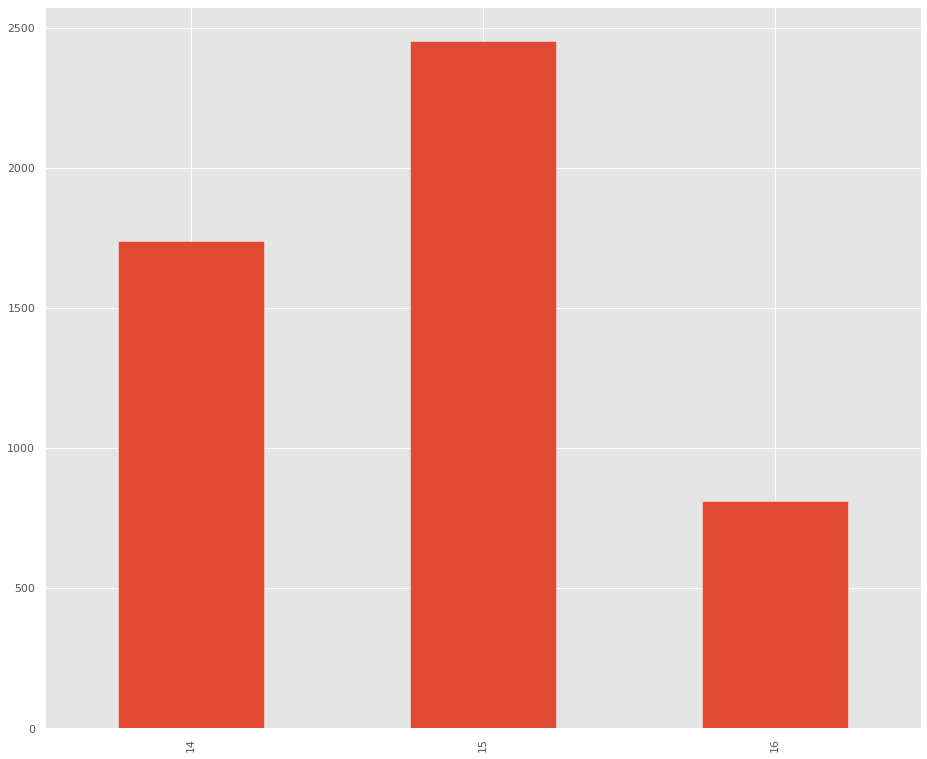

In [485]:
Tweets['day'].value_counts().sort_index().plot(kind='bar')

In [487]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [488]:
Tweets[Tweets['year']==2022]['text']

0       RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε να λ...
1       @maniatis_kinik @MikrosEroas1 @manourasv @Neme...
2       RT @Roofonfire_aa: Ότι δηλαδή Μακρόπουλος, Κυρ...
3       RT @mitralexis: Προσπαθήσαμε με τον φίλο Στέφα...
4       RT @_ThePaperman: Η Ντόρα Μπακογιάννη είπε συμ...
                              ...                        
4995    Υποκλοπές: Κόντρες στη Βουλή για την ΠΝΠ και τ...
4996    RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...
4997    RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...
4998    RT @tetRadio: Είναι απορίας άξιο γιατί η Νέα Δ...
4999    RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...
Name: text, Length: 5000, dtype: object

In [489]:
text = Tweets['text'].str.replace('ά','α').str.replace("έ", "ε").str.replace('ή','η').str.replace('ί','ι').str.replace('ό','ο').str.replace('ύ','υ').str.replace('ώ','ω')

In [490]:
text = Tweets[Tweets['year']==2022]['text'].str.cat(sep = '.').replace("amp", ' ')
text

'RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε να λέτε.\n\n#υποκλοπες #ΝΔ_Συμμορια  .@maniatis_kinik @MikrosEroas1 @manourasv @NemesisGRE Μια χαρά έτοιμοι είναι αυτοί.Έχουν δηλητηριάσει την κοινή γνώμ…  .RT @Roofonfire_aa: Ότι δηλαδή Μακρόπουλος, Κυρανάκης και λοιποί συγγενείς συμμετέχουν στην εξεταστική για να βγάλουν στο φως την αλήθεια κα….RT @mitralexis: Προσπαθήσαμε με τον φίλο Στέφανο Ρέππα μια προσομοίωση των διαλόγων στο Μέγαρο Μαξίμου αυτές τις μέρες. Δεν είναι καλό το κ….RT @_ThePaperman: Η Ντόρα Μπακογιάννη είπε συμπλεγματικό τον αρχηγό του #ΠΑΣΟΚ γιατί κατήγγειλε την παρακολούθηση του από το σύστημα μητ#Μη….RT @OmadaMnimis: «Φως παντού» αλλά όχι και να μάθουμε γιατί παρακολουθούσαν KAI τον βουλευτή, τομεάρχη Προστασίας του Πολίτη του ΣΥΡΙΖΑ, Χρ….RT @jailthebankster: Η #μιντιακη_χουντα του καθεστώτος Μητσοτάκη στήνει #Πιτσιορλιαδα για να ξεχαστεί το γεγονός ότι ο αρχι-μαφιόζος Λουδοβ….RT @Koulara555: Απο πότε ειμαστε σε πολεμο με τη Ρωσια; #Ρωσια #υποκλοπες  .RT @ziogas_ilias: Τ

In [491]:
list(STOPWORDS)[0:20]

['like',
 'below',
 "isn't",
 'whom',
 'yourselves',
 'the',
 "she'd",
 "why's",
 'after',
 'to',
 "they'll",
 'for',
 'which',
 'you',
 'both',
 "let's",
 'in',
 'his',
 'we',
 'with']

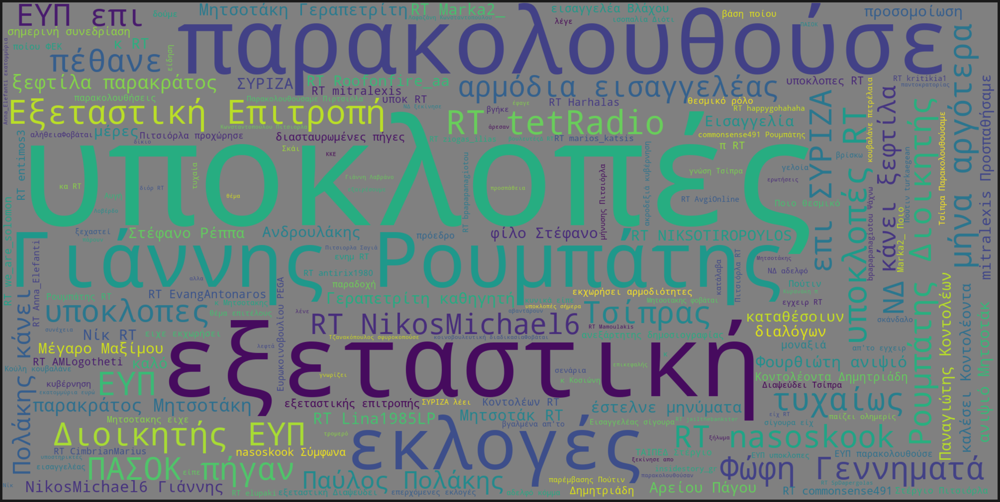

In [521]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'gray'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [522]:
import spacy
!python -m spacy download el_core_news_sm

2022-09-17 15:56:47.955747: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.6 MB 32.9 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')


In [523]:
nlp = spacy.load('el_core_news_sm')
list(nlp.Defaults.stop_words)[0:20]

['τόσου',
 'πώς',
 'όλως',
 'πάνω',
 'αυτές',
 'έγκαιρα',
 'εκείνη',
 'εκείνης',
 'κάμποσα',
 'μόνους',
 'καθώς',
 'έστω',
 'άνω',
 'κατ',
 'εκείνο',
 'καμίας',
 'μετά',
 'ετέραι',
 'καθένα',
 'ετούτους']

In [524]:
text = Tweets['text'].str.cat(sep = '.').replace('.','').strip()
text = text.replace('amp','').strip()
text = text.replace('rt','').strip()
text = text.replace('\n','').strip()
text = text.replace(':','').strip()
text

'RT @Roofonfire_aa Καταλάβατε; Καταλάβαμε να λέτε#υποκλοπες #ΝΔ_Συμμορια  @maniatis_kinik @MikrosEroas1 @manourasv @NemesisGRE Μια χαρά έτοιμοι είναι αυτοίΈχουν δηλητηριάσει την κοινή γνώμ…  RT @Roofonfire_aa Ότι δηλαδή Μακρόπουλος, Κυρανάκης και λοιποί συγγενείς συμμετέχουν στην εξεταστική για να βγάλουν στο φως την αλήθεια κα…RT @mitralexis Προσπαθήσαμε με τον φίλο Στέφανο Ρέππα μια προσομοίωση των διαλόγων στο Μέγαρο Μαξίμου αυτές τις μέρες Δεν είναι καλό το κ…RT @_ThePaperman Η Ντόρα Μπακογιάννη είπε συμπλεγματικό τον αρχηγό του #ΠΑΣΟΚ γιατί κατήγγειλε την παρακολούθηση του από το σύστημα μητ#Μη…RT @OmadaMnimis «Φως παντού» αλλά όχι και να μάθουμε γιατί παρακολουθούσαν KAI τον βουλευτή, τομεάρχη Προστασίας του Πολίτη του ΣΥΡΙΖΑ, Χρ…RT @jailthebankster Η #μιντιακη_χουντα του καθεστώτος Μητσοτάκη στήνει #Πιτσιορλιαδα για να ξεχαστεί το γεγονός ότι ο αρχι-μαφιόζος Λουδοβ…RT @Koulara555 Απο πότε ειμαστε σε πολεμο με τη Ρωσια; #Ρωσια #υποκλοπες  RT @ziogas_ilias Τα σενάρια περί παρέμβασ

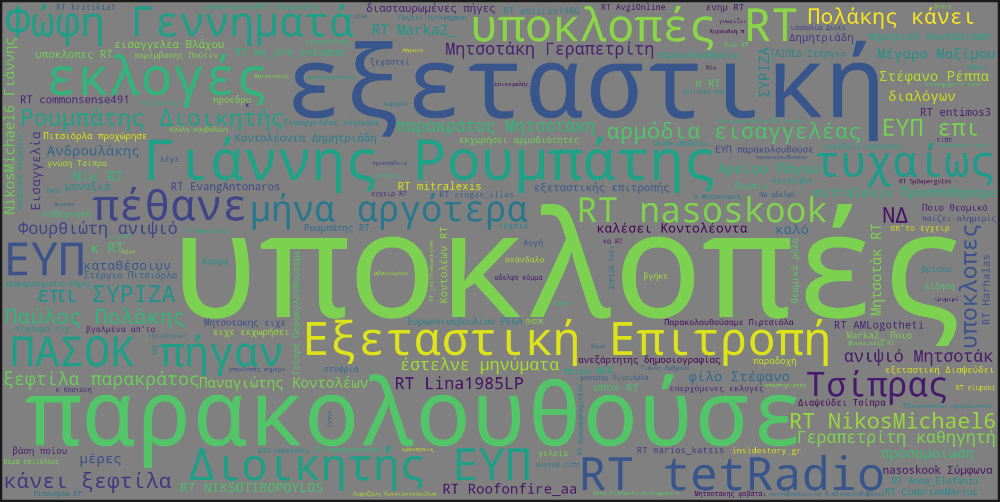

In [525]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'gray'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [526]:
from PIL import Image
import numpy as np

In [527]:
doc = nlp(Tweets['text'][1])

In [528]:
for token in doc:
    print(token, token.lemma_)

@maniatis_kinik @maniatis_kinik
@MikrosEroas1 @MikrosEroas1
@manourasv @manourasv
@NemesisGRE @NemesisGRE
Μια ένας
χαρά χαρά
έτοιμοι έτοιμοι
είναι είμαι
αυτοί αυτός
. .
Έχουν Έχουν
δηλητηριάσει δηλητηριάσει
την ο
κοινή κοινός
γνώμ γνώμ
… …
   


In [529]:
' '.join(token.lemma_ for token in doc)
text

'RT @Roofonfire_aa Καταλάβατε; Καταλάβαμε να λέτε#υποκλοπες #ΝΔ_Συμμορια  @maniatis_kinik @MikrosEroas1 @manourasv @NemesisGRE Μια χαρά έτοιμοι είναι αυτοίΈχουν δηλητηριάσει την κοινή γνώμ…  RT @Roofonfire_aa Ότι δηλαδή Μακρόπουλος, Κυρανάκης και λοιποί συγγενείς συμμετέχουν στην εξεταστική για να βγάλουν στο φως την αλήθεια κα…RT @mitralexis Προσπαθήσαμε με τον φίλο Στέφανο Ρέππα μια προσομοίωση των διαλόγων στο Μέγαρο Μαξίμου αυτές τις μέρες Δεν είναι καλό το κ…RT @_ThePaperman Η Ντόρα Μπακογιάννη είπε συμπλεγματικό τον αρχηγό του #ΠΑΣΟΚ γιατί κατήγγειλε την παρακολούθηση του από το σύστημα μητ#Μη…RT @OmadaMnimis «Φως παντού» αλλά όχι και να μάθουμε γιατί παρακολουθούσαν KAI τον βουλευτή, τομεάρχη Προστασίας του Πολίτη του ΣΥΡΙΖΑ, Χρ…RT @jailthebankster Η #μιντιακη_χουντα του καθεστώτος Μητσοτάκη στήνει #Πιτσιορλιαδα για να ξεχαστεί το γεγονός ότι ο αρχι-μαφιόζος Λουδοβ…RT @Koulara555 Απο πότε ειμαστε σε πολεμο με τη Ρωσια; #Ρωσια #υποκλοπες  RT @ziogas_ilias Τα σενάρια περί παρέμβασ

In [530]:
full_doc = nlp(text)

In [531]:
clear_text = ' '.join(token.lemma_ for token in full_doc)
clear_text[200:400]

'onfire_aa ότι δηλαδή Μακρόπουλος , Κυρανάκης και λοιποί συγγενέας συμμετέχω σε ο εξεταστικός για να βγάλω σε ο φως ο αλήθεια κα … RT @mitralexis Προσπαθήσαμε με ο φίλο Στέφανο Ρέππα ένας προσομοίωση ο'

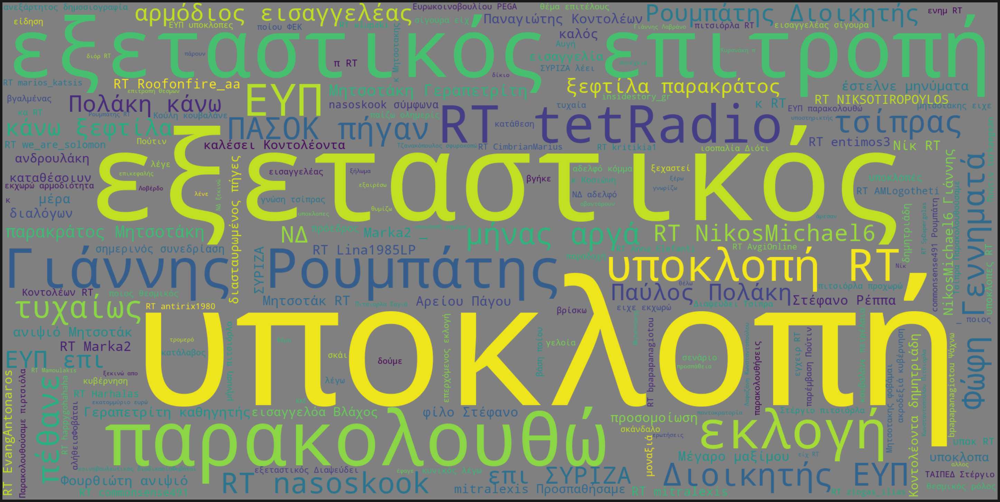

In [532]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'gray'
 ).generate(clear_text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [682]:
from collections import Counter
Counter(" ".join(Tweets["text"]).split()).most_common(16)

[('RT', 4054),
 ('για', 1998),
 ('και', 1863),
 ('ο', 1656),
 ('του', 1572),
 ('τις', 1514),
 ('με', 1278),
 ('της', 1247),
 ('να', 1227),
 ('τον', 1202),
 ('η', 1172),
 ('το', 1147),
 ('που', 1094),
 ('την', 839),
 ('δεν', 807),
 ('στην', 765)]

In [683]:
for word in nlp.Defaults.stop_words:
  print(word)
  break

τόσου


In [686]:
Tweets['text_no_stopwords'] = Tweets['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words) and word != ':' and word != '\n' and word != "amp" and word != 'rt' and word != ',']))
Tweets['text_no_stopwords'] = Tweets['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (nlp.Defaults.stop_words)]))
Tweets['clean_text_no_stopwords'] = Tweets['text']
#for stopword in nlp.Defaults.stop_words:
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: ' '.join([word for word in x.split() if word not in nlp.Defaults.stop_words and word != "ή" and word != "ία" and word != "κι"]))
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: x.replace("amp", "").strip())
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: x.replace("rt", "").strip())
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: x.replace("RT", "").strip())
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: x.replace(":", "").strip())
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: x.replace(",", "").strip())
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: x.replace("\n", "").strip())
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: x.replace(".", "").strip())
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: x.replace(" κ ", " ").strip())
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: remove_stop_words(x, nlp))
Tweets['clean_text_no_stopwords'] = Tweets['clean_text_no_stopwords'].apply(lambda x: x.translate(str.maketrans('', '', string.punctuation + '…«»')))




In [687]:
freq = Counter(" ".join(Tweets["clean_text_no_stopwords"]).split()).most_common(16)
freq

[('υποκλοπές', 1409),
 ('httpstco', 1075),
 ('ΕΥΠ', 954),
 ('υποκλοπες', 714),
 ('Ρουμπάτης', 476),
 ('εξεταστική', 429),
 ('ΣΥΡΙΖΑ', 428),
 ('παρακολουθούσε', 390),
 ('Εξεταστική', 328),
 ('ΝΔ', 326),
 ('Γιάννης', 311),
 ('εκλογές', 309),
 ('Κοντολέων', 272),
 ('Μητσοτάκη', 267),
 ('ΠΑΣΟΚ', 264),
 ('Διοικητής', 256)]

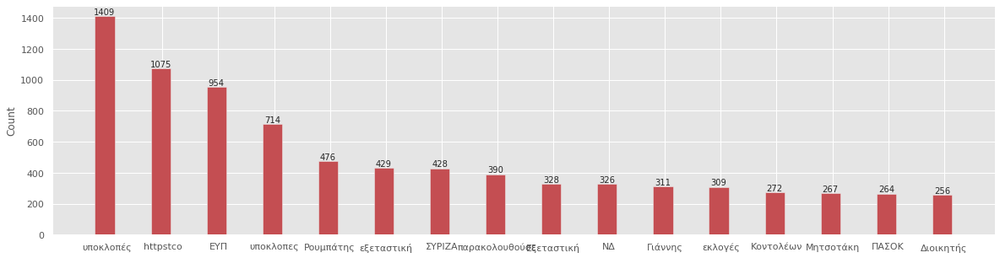

In [688]:
names, values = zip(*freq)
stopwords = nlp.Defaults.stop_words
ind = np.arange(len(freq))  
width = 0.35      

fig, ax = plt.subplots(figsize=(20,5))
rects1 = ax.bar(ind, values, width, color='r')
ax.set_ylabel('Count')
ax.set_xticks(ind+width/10.)
ax.set_xticklabels(names)

def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height,
                '%d' % int(height),
                ha='center', va='bottom')

autolabel(rects1)

plt.show()

# **Vectorizing**

In [556]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()

In [557]:
count_vector = cv.fit_transform(Tweets['text'])

In [558]:
count_vector.shape

(5000, 5598)

In [559]:
cv.get_feature_names()

results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 

results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,000,000χιλιάδες,00tbvnyyjl,03d6xvpybi,07zmnrvzhn,0aksk6gq6x,0egobrklvi,0kfmtopwwm,0kqzradqvr,0nyxas,...,ότι,όφελος,όχι,ύπαρξή,ύποπτες,ύφεση,ύφος,ώρα,ώρες,ώστε
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [560]:
cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95)

In [561]:
count_vector = cv.fit_transform(Tweets['text'])

In [562]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,amlogotheti,amp,anna_elefanti,antirix1980,avgionline,bpapapanagiotou,cimbrianmarius,co,commonsense491,elupaki,...,υπόθεση,φέλιξ,φίλο,φεκ,φοβάται,φουρθιώτη,φως,φώφη,ψάχνω,ψέματα
0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [565]:
from html import unescape
def my_tokenizer(doc):
    doc_clean = unescape(doc).lower()
    tokens = nlp(doc_clean)
    lemmatized_tokens = [token.lemma_ for token in tokens if (len(str(token.lemma_))>2)]
    
    return(lemmatized_tokens)

In [566]:
 cv = CountVectorizer(stop_words= nlp.Defaults.stop_words, min_df=0.01, max_df=0.95, tokenizer=my_tokenizer)
 count_vector = cv.fit_transform(Tweets['text'])
 results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
 results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['άρας', 'έκασε ο', 'έτερα', 'ήμω', 'ήσω', 'ίσιος', 'αλλαχούς', 'αλλιώτικος', 'αλλοιώτικας', 'αρκετός', 'γίνομαι', 'γρήγορος', 'δίπλας', 'είχος', 'εαυτής', 'εαυτός', 'εκάστος', 'εμένος', 'επόμενος', 'εσένος', 'εχτής', 'κάνενς', 'κάνω', 'λοιπός', 'μέλω', 'μερικός', 'μονομιά', 'μπορώ', 'μόνα', 'ολόγυρας', 'ορισμένος', 'ποία', 'πολύς', 'προτός', 'προχτής', 'σε ο', 'συχνά', 'ταύ', 'ταύτοταύτο', 'τουλάχιστος', 'τρίτος', 'τός', 'τόσοις'] not in stop_words.
  % sorted(inconsistent)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,...,@amlogotheti,@anna_elefanti,@antirix1980,@avgionline,@bpapapanagiotou,@cimbrianmarius,@commonsense491,@elupaki,@entimos3,...,υποστηρικτής,υπόθεση,φέλιξ,φίλο,φεκ,φοβάμαι,φουρθιώτος,φως,φώφη,ψάχνω
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [567]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Tweets['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,co,https,rt,γεραπετρίτη,γιάννης,διοικητής,εισαγγελέας,εκλογές,εξεταστική,επιτροπή,ευπ,κοντολέων,μητσοτάκη,νδ,παρακολουθούσε,πασοκ,ρουμπάτης,συριζα,υποκλοπές,υποκλοπες
0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [568]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, ngram_range=(2, 2) ) 
count_vector = cv.fit_transform(Tweets['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,https co,rt nasoskook,rt tetradio,tetradio πέθανε,αργότερα τυχαίως,γεννηματά εκλογές,γιάννης ρουμπάτης,διοικητής ευπ,εκλογές πασοκ,εξεταστική επιτροπή,εξεταστική υποκλοπές,ευπ παρακολουθούσε,μήνα αργότερα,πέθανε φώφη,πήγαν μήνα,παρακολουθούσε νίκ,πασοκ πήγαν,συριζα εξεταστική,τυχαίως ευπ,φώφη γεννηματά
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [569]:
results.sum(axis =0).sort_values(ascending = False)

https co                1298
διοικητής ευπ            311
ευπ παρακολουθούσε       287
εξεταστική υποκλοπές     279
γιάννης ρουμπάτης        256
rt tetradio              231
εξεταστική επιτροπή      221
εκλογές πασοκ            197
αργότερα τυχαίως         196
γεννηματά εκλογές        196
μήνα αργότερα            196
πέθανε φώφη              196
πήγαν μήνα               196
πασοκ πήγαν              196
τυχαίως ευπ              196
φώφη γεννηματά           196
tetradio πέθανε          195
παρακολουθούσε νίκ       195
συριζα εξεταστική        194
rt nasoskook             193
dtype: int64

In [570]:
sum_words =  results.sum(axis =0)
sum_words.sort_values(ascending = False).head() 

https co                1298
διοικητής ευπ            311
ευπ παρακολουθούσε       287
εξεταστική υποκλοπές     279
γιάννης ρουμπάτης        256
dtype: int64

In [571]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
 #                    token_pattern = '(\\bου[οω]ρ[οω]ν[α-ωά-ώ]+\\b') )\| (\\bμετ[α-ωά-ώ]\\b) #, tokenizer=my_tokenizer)
                     token_pattern = '\\buk[a-z0-9-_]*\\b') #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Tweets['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,ukyokzms6f
0,0
1,0
2,0
3,0
4,0


In [572]:
results.sum(axis =0).sort_values(ascending = False)

ukyokzms6f    1
dtype: int64

In [573]:
cv = CountVectorizer( stop_words= nlp.Defaults.stop_words, max_features=20, #ngram_range=(1, 2), 
                     vocabulary = ['υποκλοπες', 'μητσοτακης', 'ανδρουλακης']) #, tokenizer=my_tokenizer)
count_vector = cv.fit_transform(Tweets['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,υποκλοπες,μητσοτακης,ανδρουλακης
0,1,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0


In [574]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [575]:
tfidf_vectorizer = TfidfVectorizer(stop_words= nlp.Defaults.stop_words, max_features=500)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(Tweets['text'])  #finds the tfidf score with normalization

In [576]:
results = pd.DataFrame(tfidf_matrix_train.toarray(), columns=tfidf_vectorizer.get_feature_names()) 
results.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,148,1η,2η,500,6pe58lnion,abrahamdassault,adonisgeorgiadi,amlogotheti,amp,androulakisnick,...,χρόνια,χώρας,ψάχνονται,ψάχνω,ψέματα,ψήφισε,ψηφοφόροι,όργουελ,ύποπτες,ώρες
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [577]:
from sklearn.metrics.pairwise import cosine_similarity

print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train[0:1], tfidf_matrix_train))  

cosine scores ==>  [[1.         0.38877978 0.14084962 ... 0.01415376 0.01088135 0.01415376]]


In [578]:
print("cosine scores ==> ",cosine_similarity(tfidf_matrix_train, tfidf_matrix_train))  

cosine scores ==>  [[1.         0.38877978 0.14084962 ... 0.01415376 0.01088135 0.01415376]
 [0.38877978 1.         0.         ... 0.         0.         0.        ]
 [0.14084962 0.         1.         ... 0.04648669 0.00534078 0.04648669]
 ...
 [0.01415376 0.         0.04648669 ... 1.         0.03277056 1.        ]
 [0.01088135 0.         0.00534078 ... 0.03277056 1.         0.03277056]
 [0.01415376 0.         0.04648669 ... 1.         0.03277056 1.        ]]


In [579]:
arr = cosine_similarity(tfidf_matrix_train, tfidf_matrix_train)

In [581]:
Tweets['text'].loc[3]

'RT @mitralexis: Προσπαθήσαμε με τον φίλο Στέφανο Ρέππα μια προσομοίωση των διαλόγων στο Μέγαρο Μαξίμου αυτές τις μέρες. Δεν είναι καλό το κ…'

In [582]:
Tweets['text'].loc[900]

'RT @Lina1985LP: Ο Παύλος Πολάκης κάνει ξεφτίλα παρακράτος Μητσοτάκη,Γεραπετρίτη καθηγητή που έστελνε μηνύματα με Φουρθιώτη, ανιψιό Μητσοτάκ…'

# **Emolex**

In [583]:
filepath = "https://raw.githubusercontent.com/datajour-gr/Data_journalism/master/week10/NRC_GREEK_Translated_6_2020.csv"
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [584]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13166,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13167,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13168,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13169,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13170,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [585]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(drop = True, inplace = True)

In [586]:
emolex_df.tail()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
13156,ουρλιασμα,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
13157,κροκος αυγου,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13158,νεοτερος,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13159,ζεφυρος,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13160,ζουμ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [587]:
import spacy
nlp = spacy.load('el_core_news_sm')

In [588]:
len(Tweets)
Tweets

,date,text,text_no_stopwords,clean_text_no_stopwords
0,Fri Sep 16 10:42:27 +0000 2022,RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε να λ...,RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε λέτε...,Roofonfireaa Καταλάβατε Καταλάβαμε λέτε υποκ...
1,Fri Sep 16 10:42:09 +0000 2022,@maniatis_kinik @MikrosEroas1 @manourasv @Neme...,@maniatis_kinik @MikrosEroas1 @manourasv @Neme...,maniatiskinik MikrosEroas1 manourasv NemesisGR...
2,Fri Sep 16 10:41:40 +0000 2022,"RT @Roofonfire_aa: Ότι δηλαδή Μακρόπουλος, Κυρ...","RT @Roofonfire_aa: Ότι Μακρόπουλος, Κυρανάκης ...",Roofonfireaa Μακρόπουλος Κυρανάκης λοιποί συγγ...
3,Fri Sep 16 10:41:19 +0000 2022,RT @mitralexis: Προσπαθήσαμε με τον φίλο Στέφα...,RT @mitralexis: Προσπαθήσαμε φίλο Στέφανο Ρέππ...,mitralexis Προσπαθήσαμε φίλο Στέφανο Ρέππα προ...
4,Fri Sep 16 10:41:16 +0000 2022,RT @_ThePaperman: Η Ντόρα Μπακογιάννη είπε συμ...,RT @_ThePaperman: Η Ντόρα Μπακογιάννη είπε συμ...,ThePaperman Ντόρα Μπακογιάννη είπε συμπλεγματι...
...,...,...,...,...
4995,Wed Sep 14 13:01:16 +0000 2022,Υποκλοπές: Κόντρες στη Βουλή για την ΠΝΠ και τ...,Υποκλοπές: Κόντρες Βουλή ΠΝΠ αλλαγές ΕΥΠ https...,Υποκλοπές Κόντρες Βουλή ΠΝΠ αλλαγές ΕΥΠ httpst...
4996,Wed Sep 14 13:01:01 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...","RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...",NikosMichael6 Γιάννης Ρουμπάτης Διοικητής ΕΥΠ ...
4997,Wed Sep 14 13:00:33 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...","RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...",NikosMichael6 Γιάννης Ρουμπάτης Διοικητής ΕΥΠ ...
4998,Wed Sep 14 13:00:15 +0000 2022,RT @tetRadio: Είναι απορίας άξιο γιατί η Νέα Δ...,RT @tetRadio: Είναι απορίας άξιο Νέα Δημοκρατί...,tetRadio απορίας άξιο Νέα Δημοκρατία παίρνει σ...


In [589]:
short_tweets_ypok = Tweets[['date','text' ]]

short_tweets_ypok

,date,text
0,Fri Sep 16 10:42:27 +0000 2022,RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε να λ...
1,Fri Sep 16 10:42:09 +0000 2022,@maniatis_kinik @MikrosEroas1 @manourasv @Neme...
2,Fri Sep 16 10:41:40 +0000 2022,"RT @Roofonfire_aa: Ότι δηλαδή Μακρόπουλος, Κυρ..."
3,Fri Sep 16 10:41:19 +0000 2022,RT @mitralexis: Προσπαθήσαμε με τον φίλο Στέφα...
4,Fri Sep 16 10:41:16 +0000 2022,RT @_ThePaperman: Η Ντόρα Μπακογιάννη είπε συμ...
...,...,...
4995,Wed Sep 14 13:01:16 +0000 2022,Υποκλοπές: Κόντρες στη Βουλή για την ΠΝΠ και τ...
4996,Wed Sep 14 13:01:01 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή..."
4997,Wed Sep 14 13:00:33 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή..."
4998,Wed Sep 14 13:00:15 +0000 2022,RT @tetRadio: Είναι απορίας άξιο γιατί η Νέα Δ...


In [590]:
short_tweets_ypok.tail()

,date,text
4995,Wed Sep 14 13:01:16 +0000 2022,Υποκλοπές: Κόντρες στη Βουλή για την ΠΝΠ και τ...
4996,Wed Sep 14 13:01:01 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή..."
4997,Wed Sep 14 13:00:33 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή..."
4998,Wed Sep 14 13:00:15 +0000 2022,RT @tetRadio: Είναι απορίας άξιο γιατί η Νέα Δ...
4999,Wed Sep 14 13:00:02 +0000 2022,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή..."


In [591]:
short_tweets_ypok.dtypes

date    object
text    object
dtype: object

In [592]:
short_tweets_ypok['date'] = pd.to_datetime(short_tweets_ypok['date'], format='%a %b %d %H:%M:%S +0000 %Y')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [593]:
short_tweets_ypok['year'] = pd.DatetimeIndex(short_tweets_ypok['date']).year
short_tweets_ypok['month'] = pd.DatetimeIndex(short_tweets_ypok['date']).month
short_tweets_ypok['day'] = pd.DatetimeIndex(short_tweets_ypok['date']).day
short_tweets_ypok

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,date,text,year,month,day
0,2022-09-16 10:42:27,RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε να λ...,2022,9,16
1,2022-09-16 10:42:09,@maniatis_kinik @MikrosEroas1 @manourasv @Neme...,2022,9,16
2,2022-09-16 10:41:40,"RT @Roofonfire_aa: Ότι δηλαδή Μακρόπουλος, Κυρ...",2022,9,16
3,2022-09-16 10:41:19,RT @mitralexis: Προσπαθήσαμε με τον φίλο Στέφα...,2022,9,16
4,2022-09-16 10:41:16,RT @_ThePaperman: Η Ντόρα Μπακογιάννη είπε συμ...,2022,9,16
...,...,...,...,...,...
4995,2022-09-14 13:01:16,Υποκλοπές: Κόντρες στη Βουλή για την ΠΝΠ και τ...,2022,9,14
4996,2022-09-14 13:01:01,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...",2022,9,14
4997,2022-09-14 13:00:33,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...",2022,9,14
4998,2022-09-14 13:00:15,RT @tetRadio: Είναι απορίας άξιο γιατί η Νέα Δ...,2022,9,14


In [594]:
emolex_df['word'].head(3)

0              αφεση
1    ενορκη βεβαιωση
2            εχοντας
Name: word, dtype: object

In [595]:
short_tweets_ypok['text'] = short_tweets_ypok['text'].str.replace(r'https?:\/\/.*[\r\n]*'," ")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [596]:
short_tweets_ypok.head()

,date,text,year,month,day
0,2022-09-16 10:42:27,RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε να λ...,2022,9,16
1,2022-09-16 10:42:09,@maniatis_kinik @MikrosEroas1 @manourasv @Neme...,2022,9,16
2,2022-09-16 10:41:40,"RT @Roofonfire_aa: Ότι δηλαδή Μακρόπουλος, Κυρ...",2022,9,16
3,2022-09-16 10:41:19,RT @mitralexis: Προσπαθήσαμε με τον φίλο Στέφα...,2022,9,16
4,2022-09-16 10:41:16,RT @_ThePaperman: Η Ντόρα Μπακογιάννη είπε συμ...,2022,9,16


In [597]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word, 
                      strip_accents = 'unicode',  
                      stop_words= nlp.Defaults.stop_words,
                      ngram_range=(1, 2))

In [598]:
matrix = vec.fit_transform(short_tweets_ypok['text'])
vocab = vec.get_feature_names()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:1323: UserWarning: Upper case characters found in vocabulary while 'lowercase' is True. These entries will not be matched with any documents
  "Upper case characters found in"
/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [599]:
wordcount_df.shape

(5000, 13161)

In [600]:
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [601]:
#angry words
angry_words = emolex_df[emolex_df.Anger == 1]['word']

#positive words
positive_words = emolex_df[emolex_df.Positive == 1]['word']

#sad words
sad_words = emolex_df[emolex_df.Sadness == 1]['word']

#surprise words
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']

#disgust words
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']

#anticipation words
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']

#negative words
negative_words = emolex_df[emolex_df.Negative == 1]['word']

#joy words
joy_words = emolex_df[emolex_df.Joy == 1]['word']

#trust words
trust_words = emolex_df[emolex_df.Trust == 1]['word']

#fear words
fear_words = emolex_df[emolex_df.Fear == 1]['word']

In [602]:
short_tweets_ypok.head(3)

,date,text,year,month,day
0,2022-09-16 10:42:27,RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε να λ...,2022,9,16
1,2022-09-16 10:42:09,@maniatis_kinik @MikrosEroas1 @manourasv @Neme...,2022,9,16
2,2022-09-16 10:41:40,"RT @Roofonfire_aa: Ότι δηλαδή Μακρόπουλος, Κυρ...",2022,9,16


In [603]:
short_tweets_ypok['anger'] = wordcount_df[angry_words].sum(axis=1)

short_tweets_ypok['positivity'] = wordcount_df[positive_words].sum(axis=1)


short_tweets_ypok['joy'] = wordcount_df[joy_words].sum(axis=1)


short_tweets_ypok['disgust'] = wordcount_df[disgust_words].sum(axis=1)


short_tweets_ypok['surprise'] = wordcount_df[surprise_words].sum(axis=1)

short_tweets_ypok['trust'] = wordcount_df[trust_words].sum(axis=1)


short_tweets_ypok['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)


short_tweets_ypok['sad'] = wordcount_df[sad_words].sum(axis=1)

short_tweets_ypok['negative'] = wordcount_df[negative_words].sum(axis=1)

short_tweets_ypok['fear'] = wordcount_df[fear_words].sum(axis=1)


In [604]:
short_tweets_ypok

,date,text,year,month,day,anger,positivity,joy,disgust,surprise,trust,anticipation,sad,negative,fear
0,2022-09-16 10:42:27,RT @Roofonfire_aa: Καταλάβατε; Καταλάβαμε να λ...,2022,9,16,0,0,0,0,0,0,0,0,1,0
1,2022-09-16 10:42:09,@maniatis_kinik @MikrosEroas1 @manourasv @Neme...,2022,9,16,0,1,1,0,1,0,1,0,0,0
2,2022-09-16 10:41:40,"RT @Roofonfire_aa: Ότι δηλαδή Μακρόπουλος, Κυρ...",2022,9,16,0,2,1,0,0,2,1,0,0,0
3,2022-09-16 10:41:19,RT @mitralexis: Προσπαθήσαμε με τον φίλο Στέφα...,2022,9,16,0,0,0,0,0,0,0,0,0,0
4,2022-09-16 10:41:16,RT @_ThePaperman: Η Ντόρα Μπακογιάννη είπε συμ...,2022,9,16,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2022-09-14 13:01:16,Υποκλοπές: Κόντρες στη Βουλή για την ΠΝΠ και τ...,2022,9,14,0,0,0,0,0,0,0,0,1,0
4996,2022-09-14 13:01:01,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...",2022,9,14,0,0,0,1,0,0,0,0,2,0
4997,2022-09-14 13:00:33,"RT @NikosMichael6: Γιάννης Ρουμπάτης, Διοικητή...",2022,9,14,0,0,0,1,0,0,0,0,2,0
4998,2022-09-14 13:00:15,RT @tetRadio: Είναι απορίας άξιο γιατί η Νέα Δ...,2022,9,14,0,1,0,0,0,0,0,0,4,2


In [693]:
max = 0
happiest_tweet = ""
for i in range(0,len(short_tweets_ypok)):

  if short_tweets_ypok.iloc[i]['positivity'] > max:
    happiest_tweet = short_tweets_ypok.iloc[i]['text']
    max = short_tweets_ypok.iloc[i]['positivity']


happiest_tweet

'«Ζητώ ισχυρή εντολή από τη πρώτη Κυριακή για σταθερή κυβέρνηση -σταθερή οικονομία -σταθερή Δημοκρατία, με πρωθυπουρ…  '

In [606]:
max = 0
negative_tweet = ""
for i in range(0,len(short_tweets_ypok)):
  
  if short_tweets_ypok.iloc[i]['negative'] > max:
    negative_tweet = short_tweets_ypok.iloc[i]['text']
    max = short_tweets_ypok.iloc[i]['negative']


negative_tweet

'RT @tetRadio: Είναι απορίας άξιο γιατί η Νέα Δημοκρατία παίρνει πάνω της το σκάνδαλο με τις #υποκλοπές, ένα σκάνδαλο που αφορά αποκλειστικά…'

In [607]:
max = 0
saddest_tweet = ""
for i in range(0,len(short_tweets_ypok)):

  if short_tweets_ypok.iloc[i]['sad'] > max:
    saddest_tweet = short_tweets_ypok.iloc[i]['text']
    max = short_tweets_ypok.iloc[i]['sad']

saddest_tweet

'RT @giodimo_: Επειδή η Ντορα Μπακογιάννη δεν ξέρει νομικά, και απειλεί με 10 χρόνια φυλακή όποιον μιλήσει για τις υποκλοπές, πείτε της ότι…'

In [608]:
max = 0
fear_tweet = ""
for i in range(0,len(short_tweets_ypok)):
  
  if short_tweets_ypok.iloc[i]['fear'] > max:
    fear_tweet = short_tweets_ypok.iloc[i]['text']
    max = short_tweets_ypok.iloc[i]['fear']

fear_tweet

'RT @Roofonfire_aa: Το πόσο φοβούνται οι της ΝΔ το σκάνδαλο των #υποκλοπες και δεν θέλουν να μπλέξουν οι βουλευτές φαίνεται από το ποιους βο…'

In [609]:
max = 0
trust_tweet = ""
for i in range(0,len(short_tweets_ypok)):
  if short_tweets_ypok.iloc[i]['trust'] > max:
    trust_tweet = short_tweets_ypok.iloc[i]['text']
    max = short_tweets_ypok.iloc[i]['trust']

trust_tweet

'RT @CorfiatLoukas: Ν.Ξυδάκης άξιος δημοσιογράφος που ξεσκεπάζει όχι μόνο τον ψεύτη Μητσοτακη αλλά κ όλους τους πουλημένους δημοσιογράφος στ…'

In [610]:
short_tweets_ypok.set_index('date' , inplace=True)

In [611]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

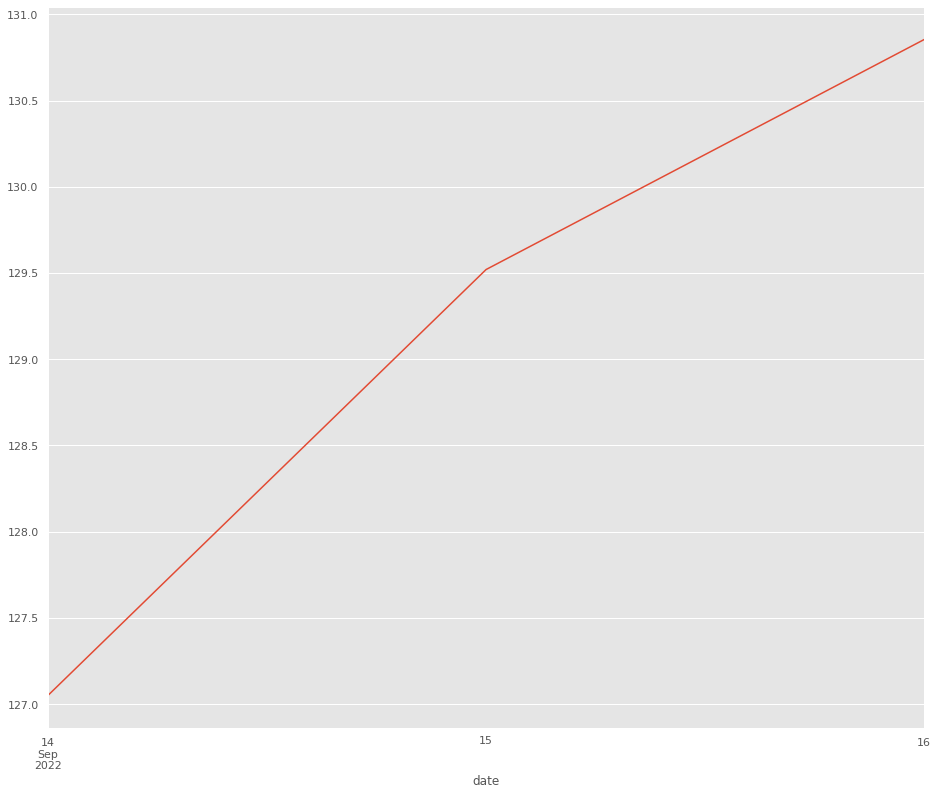

In [612]:
short_tweets_ypok['text'].str.len().resample('D').mean().plot() 

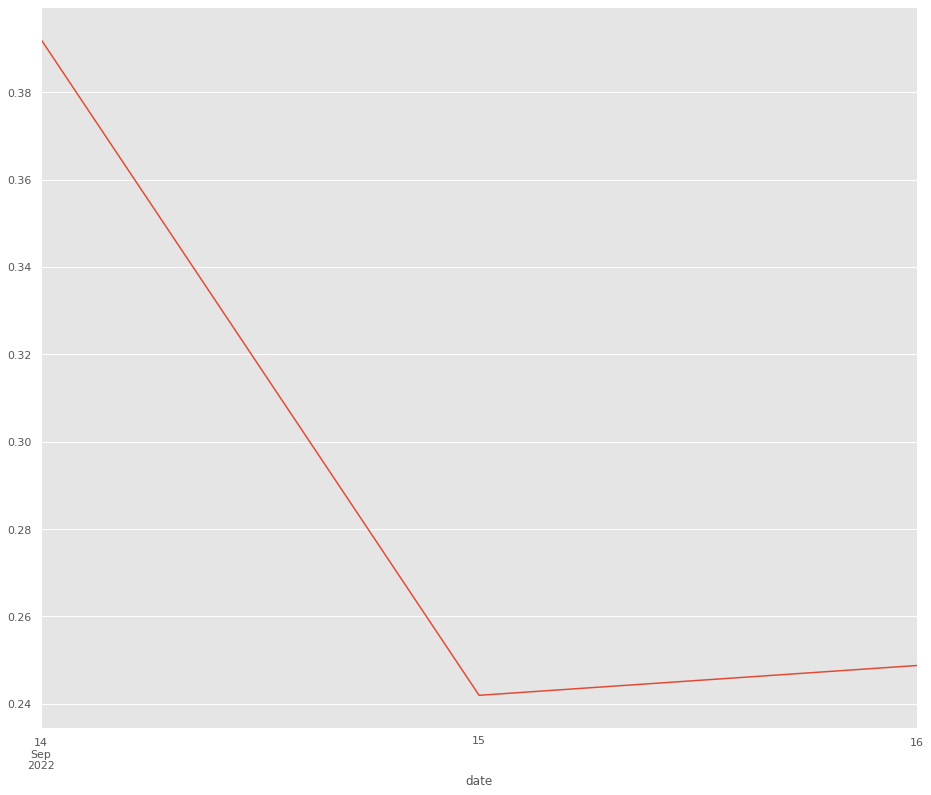

In [623]:
short_tweets_ypok['positivity'].resample('D').mean().plot() 

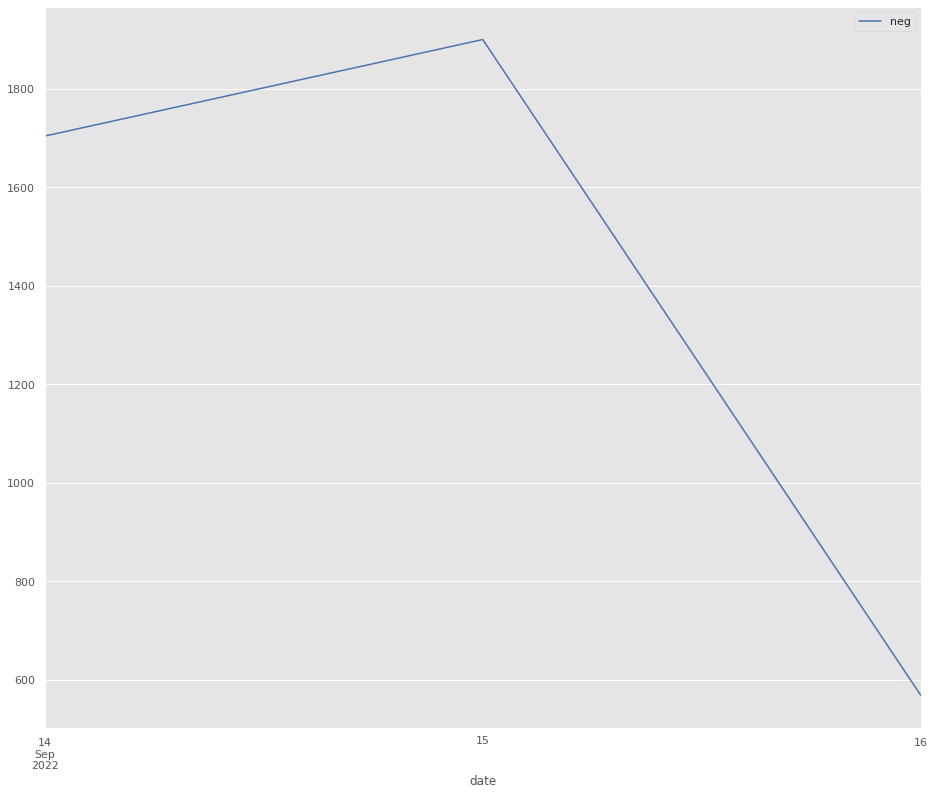

In [614]:
short_tweets_ypok['negative'].resample('D').sum().plot(color = 'b',label = 'neg').legend() 

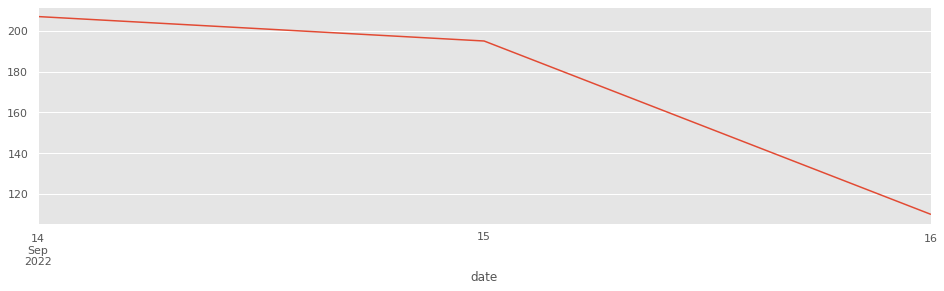

In [615]:
short_tweets_ypok['anger'].resample('D').sum().plot(figsize=(16,4))

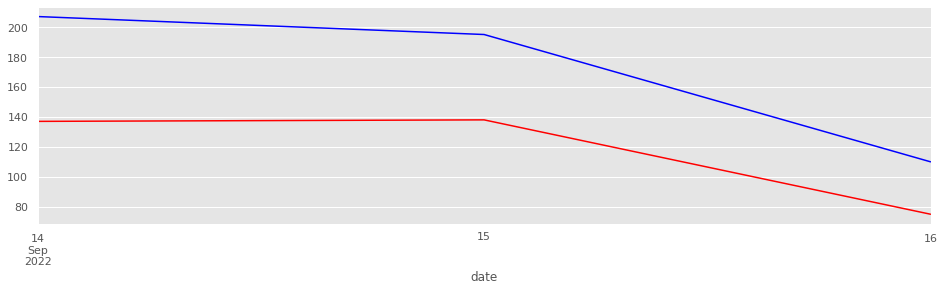

In [616]:
ax = short_tweets_ypok['anger'].resample('D').sum().plot(figsize=(16,4), color = 'blue')
short_tweets_ypok['joy'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'red')

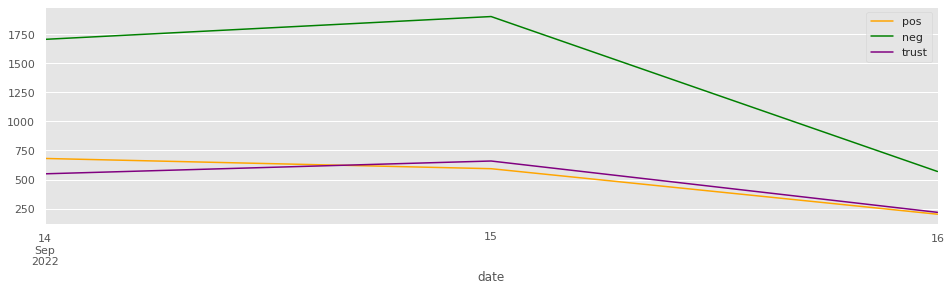

In [692]:
ax = short_tweets_ypok['positivity'].resample('D').sum().plot(figsize=(16,4), color = 'orange', label = 'pos')
short_tweets_ypok['negative'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'green', label ='neg')
short_tweets_ypok['trust'].resample('D').sum().plot(figsize=(16,4), ax = ax, color = 'purple', label = 'trust').legend()

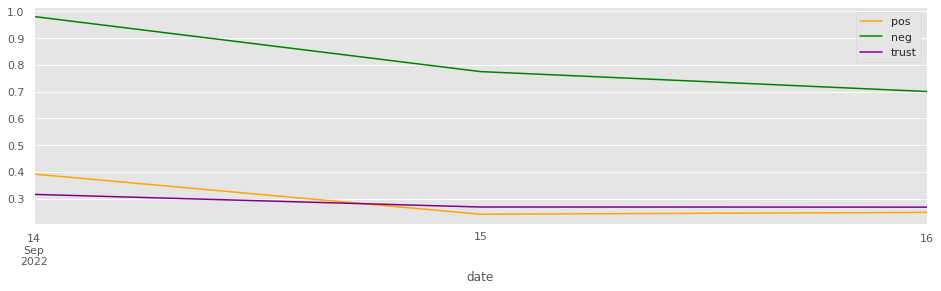

In [626]:
ax = short_tweets_ypok['positivity'].resample('D').mean().plot(figsize=(16,4), 
                                                          color = 'orange', label='pos')
short_tweets_ypok['negative'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'green')
short_tweets_ypok['trust'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'purple').legend()

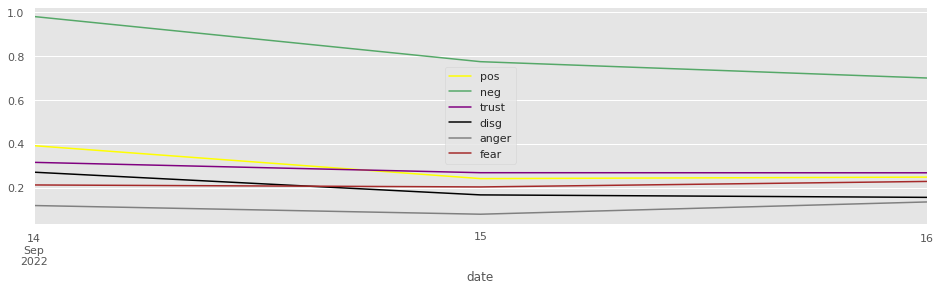

In [627]:
plt.style.use('ggplot')
ax = short_tweets_ypok['positivity'].resample('D').mean().plot(figsize=(16,4), 
                                                          color = 'yellow', label='pos')
short_tweets_ypok['negative'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                   label = 'neg', color = 'g')
short_tweets_ypok['trust'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'trust',color = 'purple').legend()

short_tweets_ypok['disgust'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'disg',color = 'black').legend() 

short_tweets_ypok['anger'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'anger',color = 'gray').legend() 

short_tweets_ypok['fear'].resample('D').mean().plot(figsize=(16,4), ax = ax, 
                                                label = 'fear',color = 'brown').legend()    

Text(0, 0.5, 'Day')

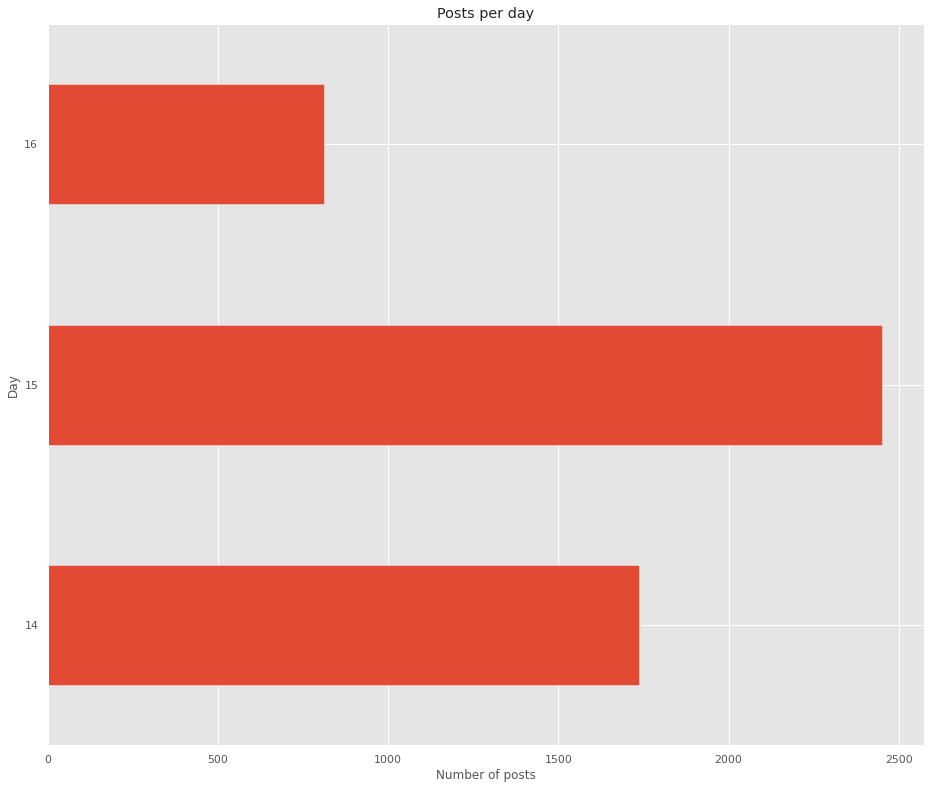

In [628]:
short_tweets_ypok['text'].groupby(by=short_tweets_ypok.index.day).count().plot(kind='barh')
plt.title("Posts per day")
plt.xlabel("Number of posts")
plt.ylabel("Day")

Text(0, 0.5, 'Hour of the day')

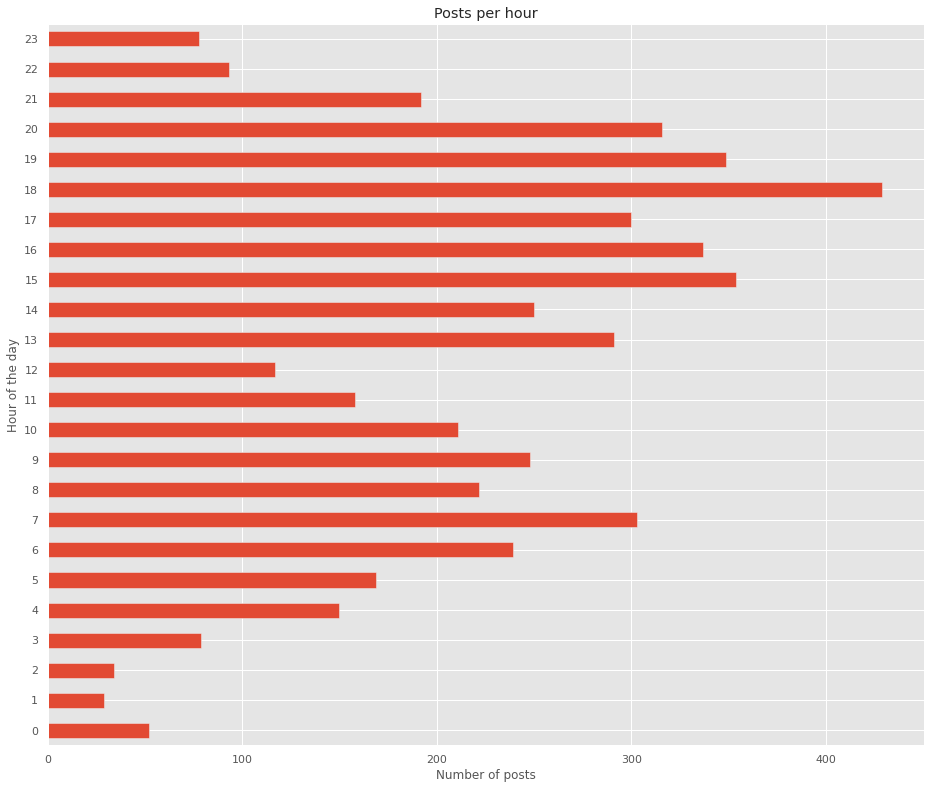

In [629]:
short_tweets_ypok['text'].groupby(by=short_tweets_ypok.index.hour).count().plot(kind='barh')
plt.title("Posts per hour")
plt.xlabel("Number of posts")
plt.ylabel("Hour of the day")

## Thodoris **Chondrogiannos**

https://twitter.com/chondrogiannos?lang=el

In [637]:
Ch = []
try:
    user_timeline = twitter.get_user_timeline(screen_name='Chondrogiannos',count=200, tweet_mode = 'extended'  )
except TwythonError as e:
    print("Error getting tweets:", e)
print("I Got:", len(user_timeline), " tweets")
for tweet in user_timeline:
    Ch.append(tweet)

I Got: 200  tweets


In [638]:
pd.DataFrame(Ch)

,created_at,id,id_str,full_text,truncated,display_text_range,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,...,quoted_status_id_str,quoted_status_permalink,retweet_count,favorite_count,favorited,retweeted,lang,extended_entities,possibly_sensitive,quoted_status
0,Wed Sep 14 18:33:04 +0000 2022,1570118450051223566,1570118450051223566,RT @reporters_gr: Διαβάστε το νέο ρεπορτάζ του...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,1569972544786284544,"{'url': 'https://t.co/Exxn5bGvY9', 'expanded':...",21,0,False,False,el,NaN,NaN,NaN
1,Tue Sep 13 10:08:45 +0000 2022,1569629147646857221,1569629147646857221,RT @SophieintVeld: Spying on citizens for poli...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,209,0,False,False,en,NaN,NaN,NaN
2,Tue Sep 13 10:08:39 +0000 2022,1569629122556461062,1569629122556461062,RT @reporters_gr: «Χρωστάμε συγγνώμη διότι ότα...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,16,0,False,False,el,NaN,NaN,NaN
3,Mon Sep 12 17:45:10 +0000 2022,1569381619592470529,1569381619592470529,RT @reporters_gr: #PredatorGate: Ο Ν. #Ανδρουλ...,False,"[0, 139]","{'hashtags': [{'text': 'PredatorGate', 'indice...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,136,0,False,False,el,NaN,NaN,NaN
4,Mon Sep 12 14:19:54 +0000 2022,1569329960774426624,1569329960774426624,"#PredatorGate: Μετά την #ΕφΣυν &amp; τα #ΝΕΑ, ...",False,"[0, 286]","{'hashtags': [{'text': 'PredatorGate', 'indice...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,NaN,NaN,16,34,False,False,el,"{'media': [{'id': 1569329680787935234, 'id_str...",True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,Wed Jun 22 14:44:35 +0000 2022,1539620369644003329,1539620369644003329,RT @reporters_gr: ❗#Thread: Στη #Βουλή οι αποκ...,False,"[0, 143]","{'hashtags': [{'text': 'Thread', 'indices': [1...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,115,0,False,False,el,NaN,NaN,NaN
196,Tue Jun 21 14:30:34 +0000 2022,1539254455434108928,1539254455434108928,RT @reporters_gr: #Thread: Συνέντευξη του Αντι...,False,"[0, 144]","{'hashtags': [{'text': 'Thread', 'indices': [1...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,17,0,False,False,el,NaN,NaN,NaN
197,Wed Jun 15 16:06:56 +0000 2022,1537104376547909633,1537104376547909633,RT @reporters_gr: #Thread: Πώς πήγε ο 1ος μήνα...,False,"[0, 139]","{'hashtags': [{'text': 'Thread', 'indices': [1...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,50,0,False,False,el,NaN,NaN,NaN
198,Tue Jun 14 12:30:36 +0000 2022,1536687550366199809,1536687550366199809,RT @reporters_gr: #Thread: Έγγραφα αποκαλύπτου...,False,"[0, 139]","{'hashtags': [{'text': 'Thread', 'indices': [1...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,68,0,False,False,el,NaN,NaN,NaN


In [639]:
for tweet in Ch:
    print(tweet['created_at'],tweet['full_text'])

Wed Sep 14 18:33:04 +0000 2022 RT @reporters_gr: Διαβάστε το νέο ρεπορτάζ του @insidestory_gr για τις σχέσεις των επιχειρηματιών Γιάννη Λαβράνου και Φέλιξ Μπίτζιου με το…
Tue Sep 13 10:08:45 +0000 2022 RT @SophieintVeld: Spying on citizens for political gains is a crime. Let’s be clear about who the perpetrators are: national governments.…
Tue Sep 13 10:08:39 +0000 2022 RT @reporters_gr: «Χρωστάμε συγγνώμη διότι όταν έβγαλαν στο φως τη δυσωδία των παρακολουθήσεων, δεν γυρίσαμε να τους ακούσουμε».

❗️Ο Καθηγ…
Mon Sep 12 17:45:10 +0000 2022 RT @reporters_gr: #PredatorGate: Ο Ν. #Ανδρουλάκης μόλις είπε στο 🇪🇺 Κοινοβούλιο ότι ο φάκελος παρακολούθησής του καταστράφηκε τη μέρα που…
Mon Sep 12 14:19:54 +0000 2022 #PredatorGate: Μετά την #ΕφΣυν &amp; τα #ΝΕΑ, η #Καθημερινή επιβεβαιώνει ότι η #ΕΥΠ κατέστρεψε τον φάκελο του #Ανδρουλάκη.

❗Η #ΕΥΠ υπό τον @kmitsotakis παρακολουθεί έναν πολιτικό αρχηγό &amp; μετά καταστρέφει τα αρχεία των υποκλοπών σε βάρος του.

Συγκάλυψη.

👉 https://t.co/1XMKooua

In [640]:
Ch_df = pd.DataFrame(Ch)
Ch_df

,created_at,id,id_str,full_text,truncated,display_text_range,entities,source,in_reply_to_status_id,in_reply_to_status_id_str,...,quoted_status_id_str,quoted_status_permalink,retweet_count,favorite_count,favorited,retweeted,lang,extended_entities,possibly_sensitive,quoted_status
0,Wed Sep 14 18:33:04 +0000 2022,1570118450051223566,1570118450051223566,RT @reporters_gr: Διαβάστε το νέο ρεπορτάζ του...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,1569972544786284544,"{'url': 'https://t.co/Exxn5bGvY9', 'expanded':...",21,0,False,False,el,NaN,NaN,NaN
1,Tue Sep 13 10:08:45 +0000 2022,1569629147646857221,1569629147646857221,RT @SophieintVeld: Spying on citizens for poli...,False,"[0, 139]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,209,0,False,False,en,NaN,NaN,NaN
2,Tue Sep 13 10:08:39 +0000 2022,1569629122556461062,1569629122556461062,RT @reporters_gr: «Χρωστάμε συγγνώμη διότι ότα...,False,"[0, 140]","{'hashtags': [], 'symbols': [], 'user_mentions...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,16,0,False,False,el,NaN,NaN,NaN
3,Mon Sep 12 17:45:10 +0000 2022,1569381619592470529,1569381619592470529,RT @reporters_gr: #PredatorGate: Ο Ν. #Ανδρουλ...,False,"[0, 139]","{'hashtags': [{'text': 'PredatorGate', 'indice...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,136,0,False,False,el,NaN,NaN,NaN
4,Mon Sep 12 14:19:54 +0000 2022,1569329960774426624,1569329960774426624,"#PredatorGate: Μετά την #ΕφΣυν &amp; τα #ΝΕΑ, ...",False,"[0, 286]","{'hashtags': [{'text': 'PredatorGate', 'indice...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,NaN,NaN,16,34,False,False,el,"{'media': [{'id': 1569329680787935234, 'id_str...",True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,Wed Jun 22 14:44:35 +0000 2022,1539620369644003329,1539620369644003329,RT @reporters_gr: ❗#Thread: Στη #Βουλή οι αποκ...,False,"[0, 143]","{'hashtags': [{'text': 'Thread', 'indices': [1...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,115,0,False,False,el,NaN,NaN,NaN
196,Tue Jun 21 14:30:34 +0000 2022,1539254455434108928,1539254455434108928,RT @reporters_gr: #Thread: Συνέντευξη του Αντι...,False,"[0, 144]","{'hashtags': [{'text': 'Thread', 'indices': [1...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,17,0,False,False,el,NaN,NaN,NaN
197,Wed Jun 15 16:06:56 +0000 2022,1537104376547909633,1537104376547909633,RT @reporters_gr: #Thread: Πώς πήγε ο 1ος μήνα...,False,"[0, 139]","{'hashtags': [{'text': 'Thread', 'indices': [1...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,50,0,False,False,el,NaN,NaN,NaN
198,Tue Jun 14 12:30:36 +0000 2022,1536687550366199809,1536687550366199809,RT @reporters_gr: #Thread: Έγγραφα αποκαλύπτου...,False,"[0, 139]","{'hashtags': [{'text': 'Thread', 'indices': [1...","<a href=""http://twitter.com/download/iphone"" r...",NaN,None,...,NaN,NaN,68,0,False,False,el,NaN,NaN,NaN


In [641]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [642]:
Ch_df.to_csv("/content/gdrive/My Drive/Colab Notebooks/Ch_twitter.tsv", sep='\t')

In [643]:
Ch = Ch_df[['created_at','full_text' ]]
Ch = Ch.rename(columns={'created_at': 'date', 'full_text': 'text'} )
Ch

,date,text
0,Wed Sep 14 18:33:04 +0000 2022,RT @reporters_gr: Διαβάστε το νέο ρεπορτάζ του...
1,Tue Sep 13 10:08:45 +0000 2022,RT @SophieintVeld: Spying on citizens for poli...
2,Tue Sep 13 10:08:39 +0000 2022,RT @reporters_gr: «Χρωστάμε συγγνώμη διότι ότα...
3,Mon Sep 12 17:45:10 +0000 2022,RT @reporters_gr: #PredatorGate: Ο Ν. #Ανδρουλ...
4,Mon Sep 12 14:19:54 +0000 2022,"#PredatorGate: Μετά την #ΕφΣυν &amp; τα #ΝΕΑ, ..."
...,...,...
195,Wed Jun 22 14:44:35 +0000 2022,RT @reporters_gr: ❗#Thread: Στη #Βουλή οι αποκ...
196,Tue Jun 21 14:30:34 +0000 2022,RT @reporters_gr: #Thread: Συνέντευξη του Αντι...
197,Wed Jun 15 16:06:56 +0000 2022,RT @reporters_gr: #Thread: Πώς πήγε ο 1ος μήνα...
198,Tue Jun 14 12:30:36 +0000 2022,RT @reporters_gr: #Thread: Έγγραφα αποκαλύπτου...


In [644]:
Ch['year'] = pd.DatetimeIndex(Ch['date']).year
Ch['month'] = pd.DatetimeIndex(Ch['date']).month
Ch['day'] = pd.DatetimeIndex(Ch['date']).day
Ch

,date,text,year,month,day
0,Wed Sep 14 18:33:04 +0000 2022,RT @reporters_gr: Διαβάστε το νέο ρεπορτάζ του...,2022,9,14
1,Tue Sep 13 10:08:45 +0000 2022,RT @SophieintVeld: Spying on citizens for poli...,2022,9,13
2,Tue Sep 13 10:08:39 +0000 2022,RT @reporters_gr: «Χρωστάμε συγγνώμη διότι ότα...,2022,9,13
3,Mon Sep 12 17:45:10 +0000 2022,RT @reporters_gr: #PredatorGate: Ο Ν. #Ανδρουλ...,2022,9,12
4,Mon Sep 12 14:19:54 +0000 2022,"#PredatorGate: Μετά την #ΕφΣυν &amp; τα #ΝΕΑ, ...",2022,9,12
...,...,...,...,...,...
195,Wed Jun 22 14:44:35 +0000 2022,RT @reporters_gr: ❗#Thread: Στη #Βουλή οι αποκ...,2022,6,22
196,Tue Jun 21 14:30:34 +0000 2022,RT @reporters_gr: #Thread: Συνέντευξη του Αντι...,2022,6,21
197,Wed Jun 15 16:06:56 +0000 2022,RT @reporters_gr: #Thread: Πώς πήγε ο 1ος μήνα...,2022,6,15
198,Tue Jun 14 12:30:36 +0000 2022,RT @reporters_gr: #Thread: Έγγραφα αποκαλύπτου...,2022,6,14


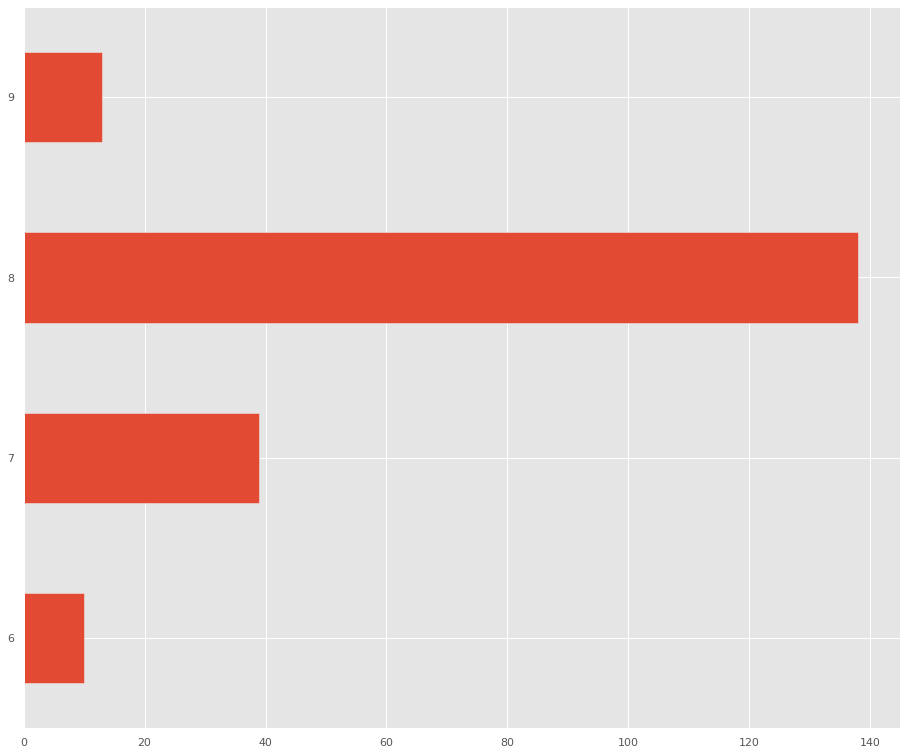

In [652]:
Ch['month'].value_counts().sort_index(ascending=True).plot(kind='barh')


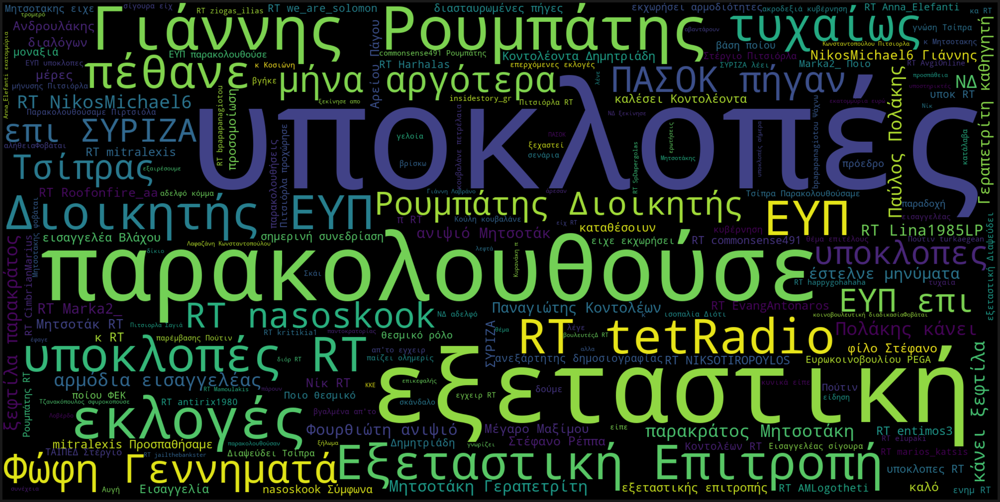

In [653]:
wordcloud = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [655]:
short_tweets_Ch = Ch[['date','text' ]]

In [656]:
short_tweets_Ch['anger'] = wordcount_df[angry_words].sum(axis=1)

short_tweets_Ch['positivity'] = wordcount_df[positive_words].sum(axis=1)


short_tweets_Ch['joy'] = wordcount_df[joy_words].sum(axis=1)


short_tweets_Ch['disgust'] = wordcount_df[disgust_words].sum(axis=1)


short_tweets_Ch['surprise'] = wordcount_df[surprise_words].sum(axis=1)

short_tweets_Ch['trust'] = wordcount_df[trust_words].sum(axis=1)


short_tweets_Ch['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)


short_tweets_Ch['sadness'] = wordcount_df[sad_words].sum(axis=1)

short_tweets_Ch['negative'] = wordcount_df[negative_words].sum(axis=1)

short_tweets_Ch['fear'] = wordcount_df[fear_words].sum(axis=1)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [657]:
max = 0
happiest_tweet = ""
for i in range(0,len(short_tweets_Ch)):
  #print(short_tweets_Rus.iloc[i]['positivity'])
  if short_tweets_Ch.iloc[i]['positivity'] > max:
    happiest_tweet = short_tweets_Ch.iloc[i]['text']
    max = short_tweets_Ch.iloc[i]['positivity']


happiest_tweet

'RT @reporters_gr: «Χρωστάμε συγγνώμη διότι όταν έβγαλαν στο φως τη δυσωδία των παρακολουθήσεων, δεν γυρίσαμε να τους ακούσουμε».\n\n❗️Ο Καθηγ…'

In [658]:
max = 0
negative_tweet = ""
for i in range(0,len(short_tweets_Ch)):
  if short_tweets_Ch.iloc[i]['negative'] > max:
    negative_tweet = short_tweets_Ch.iloc[i]['text']
    max = short_tweets_Ch.iloc[i]['negative']


negative_tweet

'RT @reporters_gr: ❗️Αγωγές πρώην αξιωματούχων κατά δημοσιογράφων που έφεραν στο φως υπόθεση που άπτεται του δημοσίου συμφέροντος «πρέπει να…'

In [660]:
max = 0
saddest_tweet = ""
for i in range(0,len(short_tweets_Ch)):
  if short_tweets_Ch.iloc[i]['sadness'] > max:
    saddest_tweet = short_tweets_Ch.iloc[i]['text']
    max = short_tweets_Ch.iloc[i]['sadness']

saddest_tweet

'RT @reporters_gr: Συστηματικές απόπειρες υποκλοπών με το #Predator στην 🇬🇷.\n\nΜετά τους #Ανδρουλάκη &amp; #Κουκάκη, η #ΕφΣυν αποκάλυψε ότι έγινε…'

In [661]:
max = 0
fear_tweet = ""
for i in range(0,len(short_tweets_Ch)):
  if short_tweets_Ch.iloc[i]['fear'] > max:
    fear_tweet = short_tweets_Ch.iloc[i]['text']
    max = short_tweets_Ch.iloc[i]['fear']

fear_tweet

'RT @reporters_gr: ❗️Αγωγές πρώην αξιωματούχων κατά δημοσιογράφων που έφεραν στο φως υπόθεση που άπτεται του δημοσίου συμφέροντος «πρέπει να…'

In [663]:
max = 0
trust_tweet = ""
for i in range(0,len(short_tweets_Ch)):
  if short_tweets_Ch.iloc[i]['trust'] > max:
    trust_tweet = short_tweets_Ch.iloc[i]['text']
    max = short_tweets_Ch.iloc[i]['trust']

trust_tweet

'RT @reporters_gr: «Χρωστάμε συγγνώμη διότι όταν έβγαλαν στο φως τη δυσωδία των παρακολουθήσεων, δεν γυρίσαμε να τους ακούσουμε».\n\n❗️Ο Καθηγ…'